## Notebook Exploratoire de questions populaires de StackOverflow

<u>Chargement des données </u>:<br>

Importer les bibliothèques nécessaires (pandas, numpy, matplotlib, seaborn, sklearn, etc.).<br>
Charger le jeu de données contenant les questions.<br>

<u>Analyse exploratoire des données (EDA)</u>  :<br>

Analyse univariée :<br>
Statistiques descriptives des variables (longueur des questions, distribution des catégories, etc.).<br>
Visualisations : histogrammes, boîtes à moustaches, etc.<br>
Analyse multivariée :<br>
Analyse des relations entre les variables (par exemple, longueur de la question vs catégorie).<br>
Utilisation de matrices de corrélation et de visualisations appropriées.<br>

<u>Nettoyage des données</u> :<br>

Conversion en minuscules, suppression de la ponctuation et des caractères spéciaux.<br>
Suppression des mots vides (stop words).<br>
Lemmatisation ou racinisation (stemming) des mots.<br>

<u>Ingénierie des caractéristiques</u>  :<br>

Utilisation de la pondération TF-IDF pour évaluer l'importance des mots.<br>
3.3 Analyse Descriptive des mots TF-IDF<br>
Réduction de dimension :<br>

Application de techniques telles que l'Analyse en Composantes Principales (PCA) ou la Troncature de la Décomposition en Valeurs Singulières (SVD) pour réduire la dimensionnalité des données.<br>

<u>Modélisation</u>  :<br>

Séparation des données en ensembles d'entraînement et de test.<br>
Entraînement de modèles de classification (par exemple, régression logistique, SVM, arbres de décision).<br>
Évaluation des performances des modèles à l'aide de métriques appropriées.<br>

In [2]:
!pip install nltk


In [3]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install phik

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install spacy

Note: you may need to restart the kernel to use updated packages.


In [6]:
# Manipulation des données, gestion de fichiers
import pandas as pd
import numpy as np
import os

# Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

# Statistiques et transformations
from scipy import stats
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Réduction de dimension et clustering
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD


# Analyse exploratoire
import missingno as msno  # Visualisation des valeurs manquantes
import phik  # Corrélations avancées

# Affichage des graphiques directement dans le notebook
%matplotlib inline
sns.set(style="whitegrid")  # Style Seaborn
plt.rcParams["figure.figsize"] = (10, 6)  # Taille par défaut des figures

# Nettoyage
from bs4 import BeautifulSoup
import re
import string
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import nltk
import spacy

# Nuages de mots
from wordcloud import WordCloud

#Affiche toutes les colonnes
pd.set_option('display.max_columns', None)

print("Bibliothèques importées avec succès !")


Bibliothèques importées avec succès !


## INTRODUCTION <br>
Le but de la démarche est de récupérer 50000 questions sur Stack Overflow et de les filtrer en SQL pour obtenir : <br>
les questions les plus vues, (j'ai utilisé ViewCount) <br>
mises en favori <u>ou</u> jugées pertinentes par les internautes, (j'ai utilisé le Score qui me paraissait représentatif de la pertinence des jugemens des utilisateurs). <br>
ayant reçu une réponse, (j'ai utilisé AnswerCount) <br>
et ayant au moins 5 tags. (j'ai calculé la longueur total - la longueur sans les caractères "<", ne restaient que les balises ">" fermant chacun des tags. <br>

SELECT TOP 50000 CreationDate, PostTypeId, Title, Body, Tags, Id, Score, ViewCount, FavoriteCount, AnswerCount<br>
FROM Posts <br>
WHERE CreationDate >= '2023-01-01 00:00:00'<br>
AND PostTypeId = 1 <br>
AND LEN(Tags) - LEN(REPLACE(Tags, '<','')) >= 5 <br>
AND ViewCount > 50 <br>
AND AnswerCount >= 1 <br>
AND SCORE >= 1 <br>

Après quoi nous ferons une analyse exploratoire des données.<br>

Puis : un nettoyage des questions, <br>
un feature engineering de type bag of words avec réduction de dimension (du vocabulaire et des tags) 

! git --version

%cd "C:/Users/ggenv/OneDrive/Documents/MLE/P5"

!git init

os.getcwd()

## 1. Lecture du fichier

In [7]:

# Spécifie le chemin du fichier
chemin_fichier = r"C:\Users\ggenv\OneDrive\Documents\MLE\P5\P5_jeu de donnees\QueryResults3.csv"

# Lecture du fichier CSV
df0 = pd.read_csv(chemin_fichier)

# Affichage des premières lignes
df0
# nous avons bien 5000 rows avec la date de début en début 2023 
# et se termine donc récemment en fin octobre 2024, donc sur presque 2 ans.

,CreationDate,PostTypeId,Title,Body,Tags,Id,Score,ViewCount,CommentCount,AnswerCount
0,2023-01-01 00:07:53,1,Optimized way to filter and return objects in ...,<p>I have the following Movie class -</p>\n<pr...,<java><algorithm><oop><data-structures><time-c...,74972603,2,80,3,1
1,2023-01-01 01:30:29,1,LiveData observer is not removed,<p>I am trying to get <code>LiveData</code> up...,<android><kotlin><android-livedata><observer-p...,74972777,1,308,4,1
2,2023-01-01 01:38:12,1,MAUI ContentView can't inherit from custom bas...,<p>I have a ContentView called HomePageOrienta...,<inheritance><controls><code-generation><maui>...,74972784,2,1153,2,1
3,2023-01-01 01:48:00,1,My if statement is not working in React Native,<p>I want to build a search bar that filters a...,<react-native><if-statement><components><react...,74972800,1,60,0,2
4,2023-01-01 02:11:45,1,jax.lax.select vs jax.numpy.where,"<p>Was taking a look at the <a href=""https://f...",<python><numpy><machine-learning><deep-learnin...,74972850,3,1787,0,1
...,...,...,...,...,...,...,...,...,...,...
49995,2024-10-29 14:59:45,1,How to extract data using LeetCode GraphQL query,<p>I just want to know that how to print all t...,<python><json><web-scraping><python-requests><...,79137785,2,269,1,1
49996,2024-10-29 15:11:25,1,Z-index ignored while transitioning using the ...,<p><strong>Note: The example below uses the <a...,<javascript><css><vue.js><z-index><view-transi...,79137836,1,128,0,1
49997,2024-10-29 15:22:44,1,Give the result string provided minimum number...,<p>A good follow up question asked in one of t...,<string><algorithm><data-structures><stack><dy...,79137882,4,268,10,1
49998,2024-10-29 15:36:53,1,How to Exclude Tagless Structs Using ASTMatcher?,<p>I'm currently working with Clang's ASTMatch...,<c><clang><abstract-syntax-tree><libtooling><c...,79137927,2,57,4,2


In [8]:
df0.describe().round(2)

,PostTypeId,Id,Score,ViewCount,CommentCount,AnswerCount
count,50000.0,50000.00,50000.00,50000.00,50000.00,50000.00
mean,1.0,76928084.93,1.95,1284.32,1.98,1.42
std,0.0,1187071.70,4.15,5813.07,3.05,0.84
min,1.0,74972603.00,1.00,51.00,0.00,1.00
25%,1.0,75897993.25,1.00,143.00,0.00,1.00
50%,1.0,76862884.00,1.00,398.00,1.00,1.00
75%,1.0,77928741.75,2.00,1048.00,3.00,2.00
max,1.0,79138054.00,360.00,695028.00,55.00,24.00


In [9]:
# On constate qu'on a aucune valeur manquante sauf sans la colonne FavoriteCount
# où il n'y avait que des valeurs manquantes et donc qu'on a éliminé dans la requête SQL


In [10]:
df0.select_dtypes(include=['object']).describe()


,CreationDate,Title,Body,Tags
count,50000,50000,50000,50000
unique,49976,50000,50000,47757
top,2023-05-24 14:07:25,Optimized way to filter and return objects in ...,<p>I have the following Movie class -</p>\n<pr...,<excel><powerbi><powerquery><powerbi-desktop><m>
freq,3,1,1,46


In [11]:
import re

# Fonction pour compter le nombre de tags dans chaque ligne
def count_tags(tags):
    # Utilisation d'une expression régulière pour trouver les tags entre les balises '<' et '>'
    tag_list = re.findall(r'<(.*?)>', str(tags))
    return len(tag_list)

# Appliquer la fonction à la colonne 'Tags' et compte les tags
df0['TagsCount'] = df0['Tags'].apply(count_tags)

# Afficher le résultat
print(df0[['Tags', 'TagsCount']].head())

df0['TagsCount'].describe()



                                                Tags  TagsCount
0  <java><algorithm><oop><data-structures><time-c...          5
1  <android><kotlin><android-livedata><observer-p...          5
2  <inheritance><controls><code-generation><maui>...          5
3  <react-native><if-statement><components><react...          5
4  <python><numpy><machine-learning><deep-learnin...          5


count    50000.000000
mean         5.000020
std          0.004472
min          5.000000
25%          5.000000
50%          5.000000
75%          5.000000
max          6.000000
Name: TagsCount, dtype: float64

In [12]:
df0[df0['TagsCount'] > 5]


,CreationDate,PostTypeId,Title,Body,Tags,Id,Score,ViewCount,CommentCount,AnswerCount,TagsCount
4570,2023-01-31 15:12:51,1,How to convert JS MediaStream to numpy array,<p>I wanted to integrate a ML project with Nex...,<machine-learning><next.js><socket.io><opencv>...,75299193,1,129,0,1,6


Toutes les questions ont 5 tags sauf une, qui en a 6, et pourtant, StackOverflow limite le nombre de Tags à 5.
On va dire que c'est une erreur mais on va laisser ça comme ça.

## 2. Analyse exploratoire des données quantitatives

## 2.1. Analyse univariée

**Date de création**

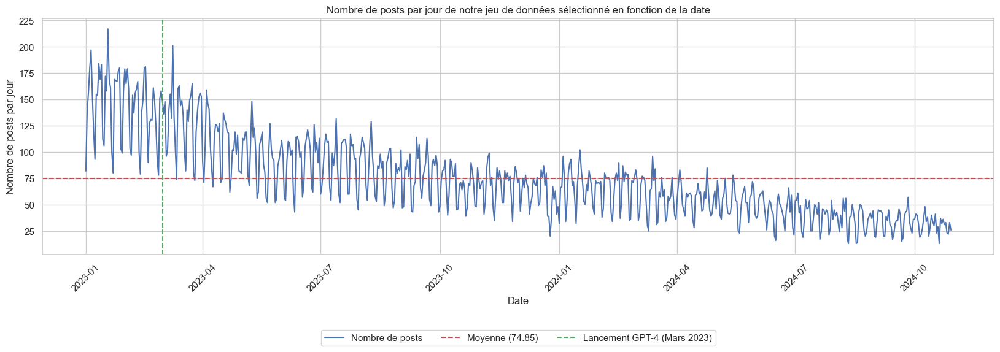

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assurer que CreationDate est bien en datetime
df0['CreationDate'] = pd.to_datetime(df0['CreationDate'])

# Compter les occurrences par jour
CreationDateByDay = df0['CreationDate'].dt.date.value_counts().sort_index()

# Convertir en DataFrame
CreationDateByDay = CreationDateByDay.reset_index()
CreationDateByDay.columns = ['Date', 'Nombre de posts']

# Calculer la moyenne
moyenne_posts = CreationDateByDay['Nombre de posts'].mean()

# Tracer la courbe
fig, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(data=CreationDateByDay, x='Date', y='Nombre de posts', ax=ax, label="Nombre de posts")

# Ajouter la ligne de la moyenne
ax.axhline(y=moyenne_posts, color='r', linestyle='--', label=f"Moyenne ({moyenne_posts:.2f})")

# Ajouter une ligne verticale en mars 2023 pour l'arrivée de GPT-4
ax.axvline(x=pd.to_datetime('2023-03-01').date(), color='g', linestyle='--', label="Lancement GPT-4 (Mars 2023)")

# Personnalisation du graphique
ax.set_xlabel("Date")
ax.set_ylabel("Nombre de posts par jour")
ax.set_title("Nombre de posts par jour de notre jeu de données sélectionné en fonction de la date")
plt.xticks(rotation=45)

# Ajouter une légende horizontale en bas du graphique avec un meilleur décalage
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=3, fontsize=11)

plt.show()


**Score (filtre Score >1)**

Le score moyen est : 1.94918
Le score médian est : 1.0


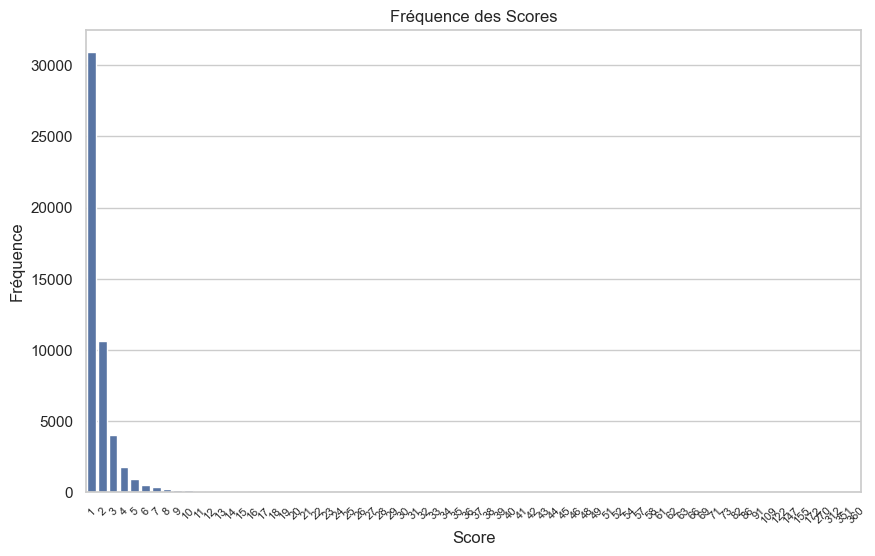

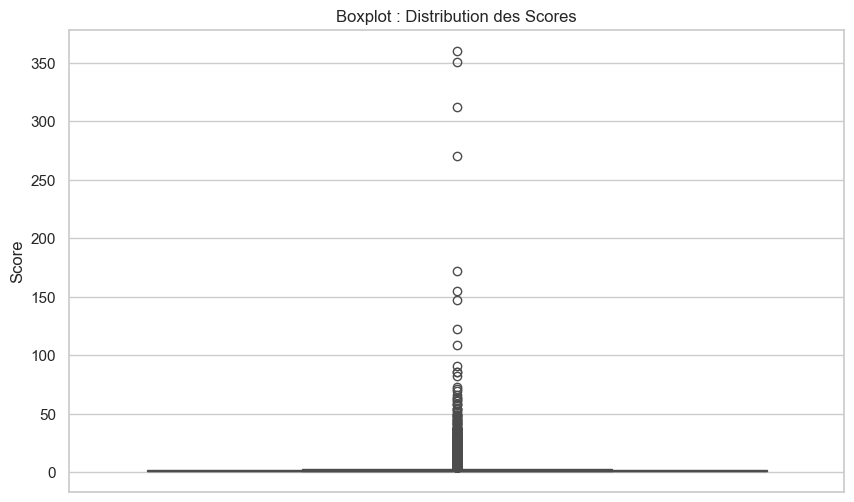

In [14]:
# Calculer le score moyen
score_moyen = df0['Score'].mean()

# Afficher le score moyen
print("Le score moyen est :", score_moyen)

score_median = df0['Score'].median()

# Afficher le score moyen
print("Le score médian est :", score_median)
#----------------

# Créer une figure pour afficher le barplot
plt.figure(figsize=(10, 6))

# Créer un barplot pour afficher la fréquence des scores
sns.barplot(x=df0['Score'].value_counts().index, y=df0['Score'].value_counts().values)

plt.xlabel('Score')
plt.xticks(rotation=45, fontsize=8)
plt.ylabel('Fréquence')
plt.title('Fréquence des Scores')
plt.show()
#----------------
# Créer une figure pour afficher le boxplot
plt.figure(figsize=(10, 6))

# Créer un boxplot pour afficher la distribution des scores
sns.boxplot(data=df0, y='Score')

plt.ylabel('Score')
plt.title('Boxplot : Distribution des Scores')
plt.show()


**ViewCount (filtre ViewCount > 50)**

La moyenne des ViewCount est : 1284.32282
La médiane des ViewCount est : 398.0


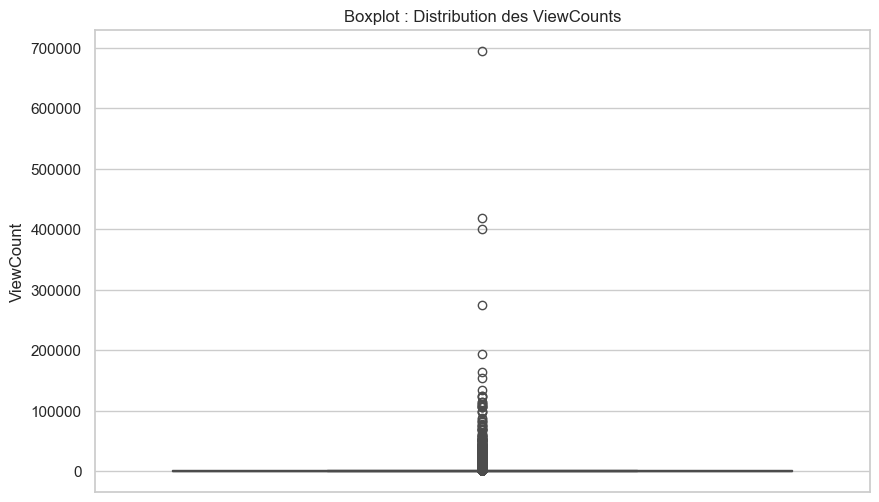

In [15]:
# Calculer la moyenne de ViewCount
view_count_moyen = df0['ViewCount'].mean()
print("La moyenne des ViewCount est :", view_count_moyen)

# Calculer la médiane de ViewCount
view_count_median = df0['ViewCount'].median()
print("La médiane des ViewCount est :", view_count_median)

# ----------------
# Au vu de la distribution maximale de 700 000 View dans le jeu de données, on ne réalisera pas de barplot
# ----------------

# Créer une figure pour afficher le boxplot pour ViewCount
plt.figure(figsize=(10, 6))

# Créer un boxplot pour afficher la distribution des ViewCount
sns.boxplot(data=df0, y='ViewCount')

plt.ylabel('ViewCount')
plt.title('Boxplot : Distribution des ViewCounts')
plt.show()


**AnwerCount (Filtre AnswerCount > 1)**

Le nombre moyen de réponses est : 1.41602
Le nombre médian de réponses est : 1.0


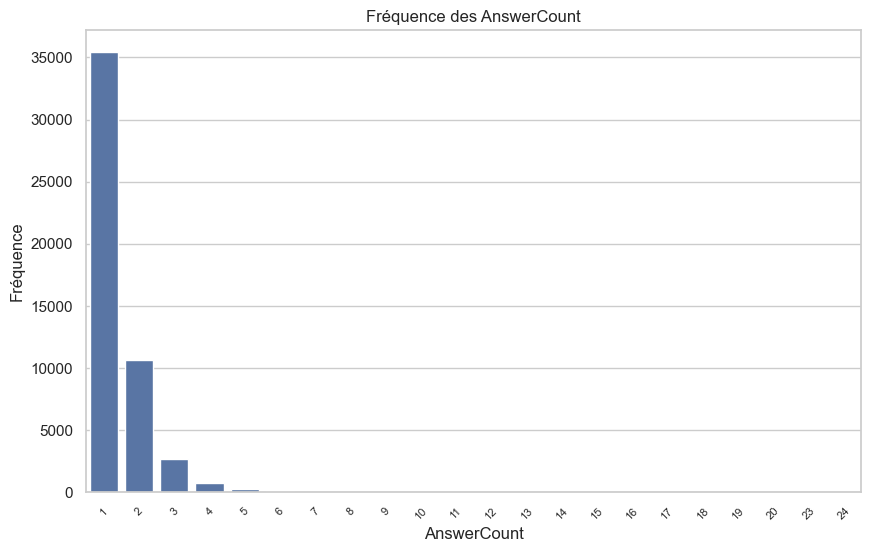

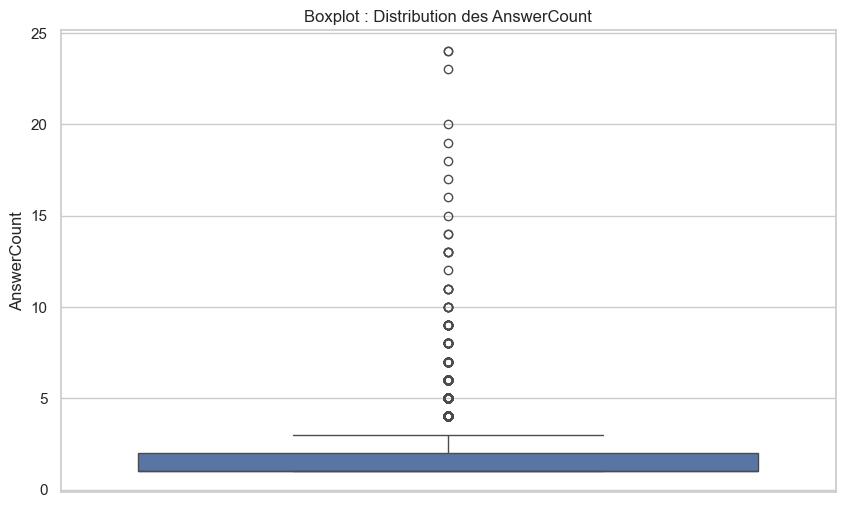

In [16]:
# Calculer le score moyen pour AnswerCount
answer_count_moyen = df0['AnswerCount'].mean()

# Afficher le score moyen
print("Le nombre moyen de réponses est :", answer_count_moyen)

answer_count_median = df0['AnswerCount'].median()

# Afficher le score médian
print("Le nombre médian de réponses est :", answer_count_median)
# -----------------------------

# Créer une figure pour afficher le barplot
plt.figure(figsize=(10, 6))

# Créer un barplot pour afficher la fréquence des AnswerCount
sns.barplot(x=df0['AnswerCount'].value_counts().index, y=df0['AnswerCount'].value_counts().values)

plt.xlabel('AnswerCount')
plt.xticks(rotation=45, fontsize=8)
plt.ylabel('Fréquence')
plt.title('Fréquence des AnswerCount')
plt.show()

# -------------------------------

# Créer une figure pour afficher le boxplot
plt.figure(figsize=(10, 6))

# Créer un boxplot pour afficher la distribution des AnswerCount
sns.boxplot(data=df0, y='AnswerCount')

plt.ylabel('AnswerCount')
plt.title('Boxplot : Distribution des AnswerCount')
plt.show()


**CommenCount (pas de filtre SQL)**

Le nombre moyen de commentaires est : 1.98218
Le nombre médian de commentaires est : 1.0


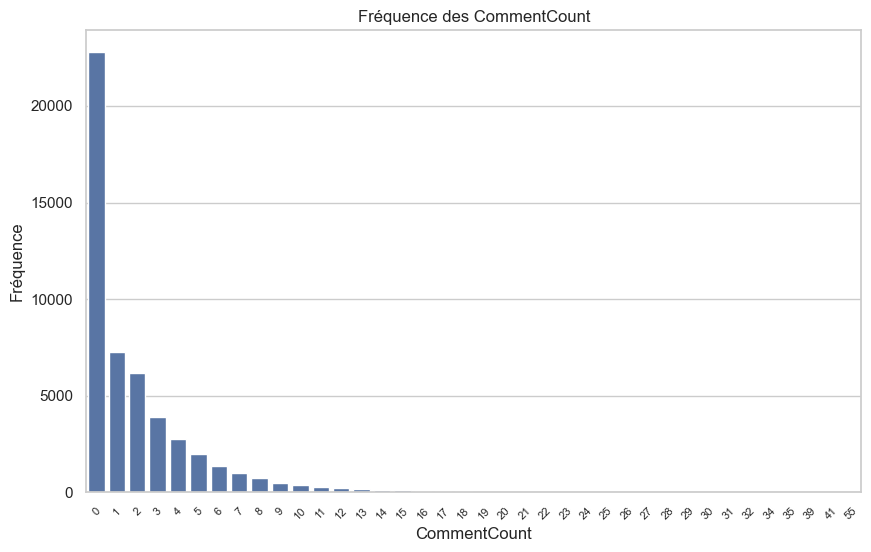

<Axes: ylabel='CommentCount'>

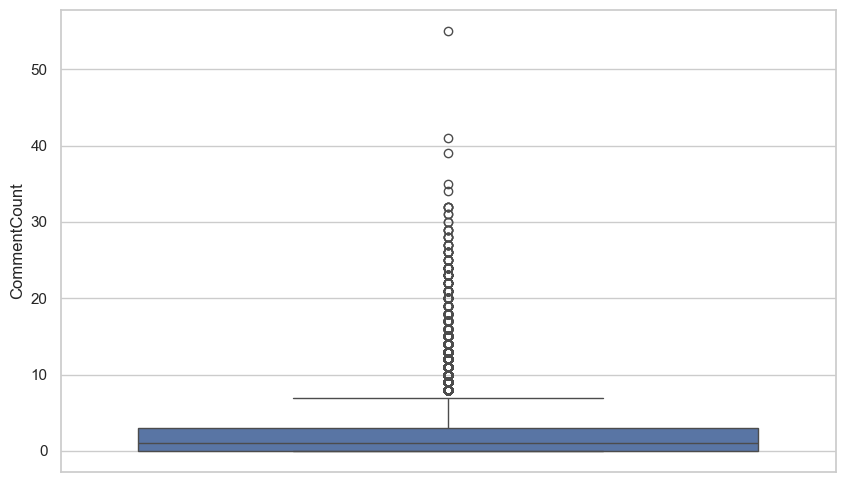

In [17]:
# Calculer le score moyen pour CommentCount
comment_count_moyen = df0['CommentCount'].mean()

# Afficher le score moyen
print("Le nombre moyen de commentaires est :", comment_count_moyen)

comment_count_median = df0['CommentCount'].median()

# Afficher le score médian
print("Le nombre médian de commentaires est :", comment_count_median)

# ------------------------
# Créer une figure pour afficher le barplot
plt.figure(figsize=(10, 6))

# Créer un barplot pour afficher la fréquence des CommentCount
sns.barplot(x=df0['CommentCount'].value_counts().index, y=df0['CommentCount'].value_counts().values)

plt.xlabel('CommentCount')
plt.xticks(rotation=45, fontsize=8)
plt.ylabel('Fréquence')
plt.title('Fréquence des CommentCount')
plt.show()

# ------------------------

# Créer une figure pour afficher le boxplot
plt.figure(figsize=(10, 6))

# Créer un boxplot pour afficher la distribution des CommentCount
sns.boxplot(data=df0, y='CommentCount')



**Longueur des titres et des questions** (df1)

In [18]:


def clean_text(text):
    # Enlever les balises HTML
    text = BeautifulSoup(text, "html.parser").get_text()

    # Remplacer spécifiquement le motif '-\n' par un espace
    text = re.sub(r'-\n', ' ', text)

    # Remplacer les retours à la ligne (\n), les retours chariot (\r), et les tabulations (\t) par un espace
    text = re.sub(r'[\r\n\t]+', ' ', text)

    # Remplacer tous les autres caractères de contrôle invisibles (caractères spéciaux) par un espace
    text = re.sub(r'[\x00-\x1F\x7F]+', ' ', text)  # Enlève les caractères de contrôle ASCII

    # Enlever les espaces multiples ou autres espaces indésirables
    text = re.sub(r'\s+', ' ', text)

    # Enlever les espaces en début et fin de chaîne
    text = text.strip()

    return text



df1 = df0.copy()  

df1["Clean_Body"] = df1["Body"].apply(clean_text)
df1["Clean_Title"] = df1["Title"].apply(clean_text)

df1["Body_length_char"] = df1["Clean_Body"].str.len()
df1["Body_length_word"] = df1["Clean_Body"].apply(lambda x: len(x.split()))

df1["Title_length_char"] = df1["Clean_Title"].str.len()
df1["Title_length_word"] = df1["Clean_Title"].apply(lambda x: len(x.split()))

# Garder uniquement les nouvelles colonnes et l'ID des messages
df1 = df1[["Id", "Clean_Title", "Clean_Body", "Body_length_char", "Body_length_word", 
           "Title_length_char", "Title_length_word"]]

df1.tail()

C:\Users\ggenv\AppData\Local\Temp\ipykernel_12232\3836958410.py:3: MarkupResemblesLocatorWarning: The input passed in on this line looks more like a filename than HTML or XML.

If you meant to use Beautiful Soup to parse the contents of a file on disk, then something has gone wrong. You should open the file first, using code like this:

    filehandle = open(your filename)

You can then feed the open filehandle into Beautiful Soup instead of using the filename.

However, if you want to parse some data that happens to look like a filename, then nothing has gone wrong: you are using Beautiful Soup correctly, and this warning is spurious and can be filtered. To make this warning go away, run this code before calling the BeautifulSoup constructor:

    from bs4 import MarkupResemblesLocatorWarning
    import warnings

    warnings.filterwarnings("ignore", category=MarkupResemblesLocatorWarning)
    
  text = BeautifulSoup(text, "html.parser").get_text()


,Id,Clean_Title,Clean_Body,Body_length_char,Body_length_word,Title_length_char,Title_length_word
49995,79137785,How to extract data using LeetCode GraphQL query,I just want to know that how to print all the ...,607,118,48,8
49996,79137836,Z-index ignored while transitioning using the ...,Note: The example below uses the View Transiti...,3498,524,66,9
49997,79137882,Give the result string provided minimum number...,A good follow up question asked in one of the ...,712,106,99,15
49998,79137927,How to Exclude Tagless Structs Using ASTMatcher?,I'm currently working with Clang's ASTMatcher ...,759,115,48,7
49999,79138054,define cause for Error in Mock When (MUnit),I tried to define Error with typeID and cause ...,773,90,43,8


In [19]:
df1.describe()

,Id,Body_length_char,Body_length_word,Title_length_char,Title_length_word
count,5.000000e+04,50000.000000,50000.000000,50000.000000,50000.000000
mean,7.692808e+07,2076.854080,257.526120,68.323560,10.847740
std,1.187072e+06,2382.639616,235.694865,24.736768,4.187389
min,7.497260e+07,32.000000,5.000000,8.000000,1.000000
25%,7.589799e+07,818.000000,121.000000,50.000000,8.000000
50%,7.686288e+07,1401.000000,194.000000,65.000000,10.000000
75%,7.792874e+07,2417.000000,312.000000,82.000000,13.000000
max,7.913805e+07,28999.000000,4439.000000,150.000000,32.000000


**Barplot et boxplot du nombre de mots et de caractères**

<Figure size 1200x800 with 0 Axes>

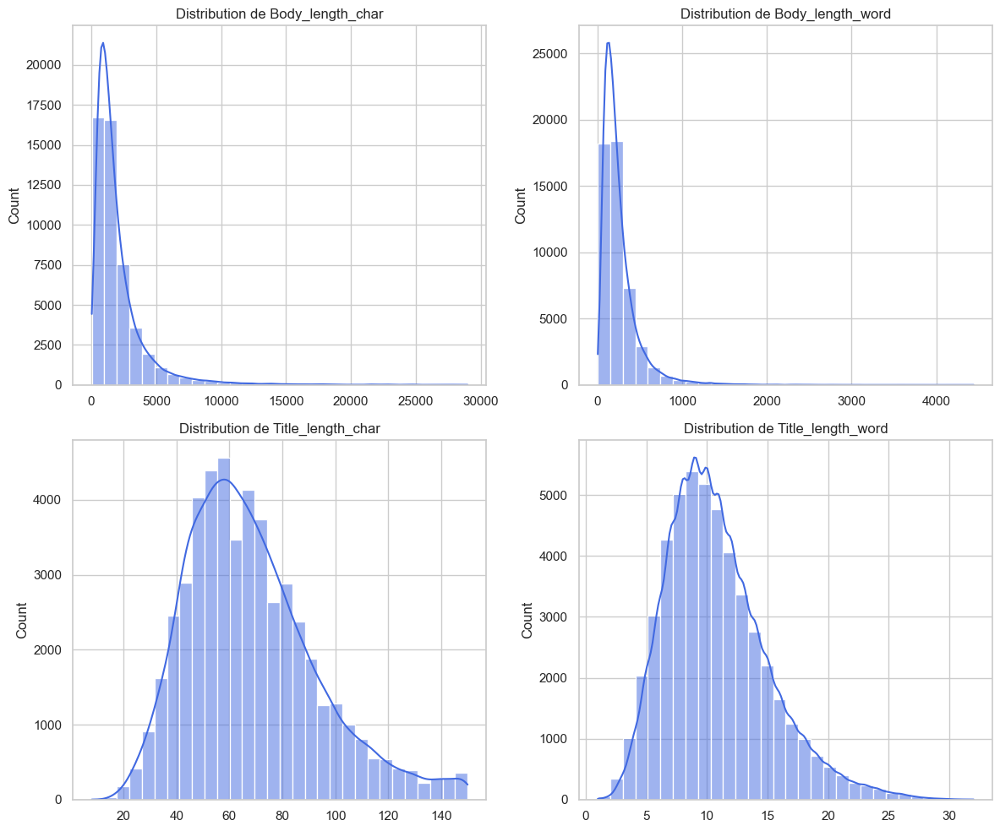

<Figure size 1200x600 with 0 Axes>

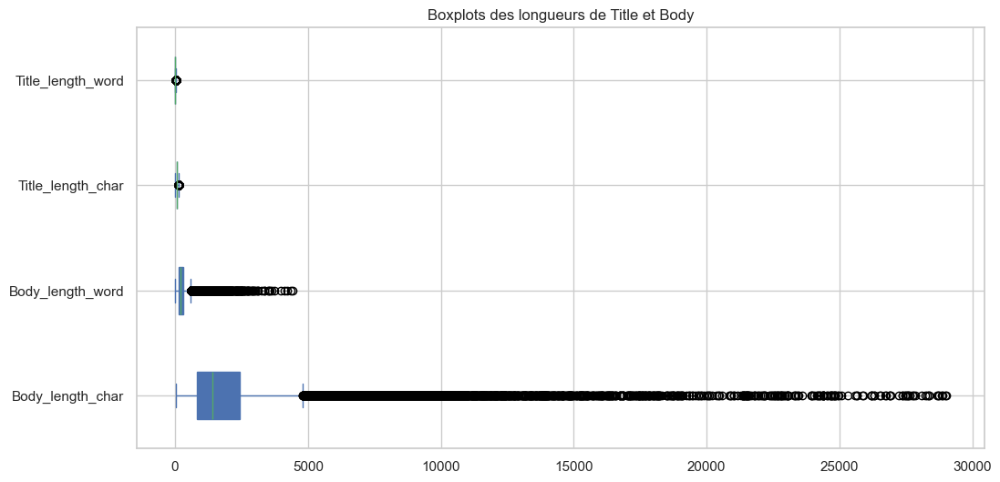

In [20]:

# Configurer le style des plots
sns.set_style("whitegrid")
plt.figure(figsize=(12, 8))

# Liste des variables
variables = ["Body_length_char", "Body_length_word", "Title_length_char", "Title_length_word"]

# Créer les subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

for i, var in enumerate(variables):
    # Barplot
    sns.histplot(df1[var], bins=30, kde=True, ax=axes[i//2, i%2], color="royalblue")
    axes[i//2, i%2].set_title(f"Distribution de {var}")
    axes[i//2, i%2].set_xlabel("")
    
plt.tight_layout()
plt.show()

# Boxplots
plt.figure(figsize=(12, 6))
df1[variables].plot(kind='box', vert=False, figsize=(12, 6), patch_artist=True)
plt.title("Boxplots des longueurs de Title et Body")
plt.show()


**Extraction des Tags** (df2)

In [21]:
import re

# Extraire les tags des balises <tag>
def extract_tags(text):
    return re.findall(r'<(.*?)>', text)

# Appliquer l'extraction des tags à chaque ligne de la colonne "Tags"
all_tags = df0['Tags'].dropna().apply(extract_tags)

# Créer une liste des tags uniques
unique_tags = list(set([tag for sublist in all_tags for tag in sublist]))

# Créer un DataFrame df2 avec une colonne pour chaque tag unique
df2 = pd.DataFrame(0, index=df0.index, columns=unique_tags)

# Remplir df2 avec des 1 là où le tag est présent dans chaque ligne
for idx, tags in all_tags.items():
    for tag in tags:
        df2.at[idx, tag] = 1

# Somme des colonnes (nombre d'apparitions de chaque tag)
column_sum = df2.sum(axis=0)

# Somme des lignes (nombre de tags par ligne)
row_sum = df2.sum(axis=1)

# Afficher les résultats
print("Somme des colonnes (nombre d'apparitions de chaque tag) :")
print(column_sum)

# Moyenne du nombre d'apparitions des tags
average_tag_occurrences = column_sum.mean()
print("En moyenne, chaque Tag apparaît", average_tag_occurrences, "fois.")

# Nombre de tags uniques
unique_tags_count = len(column_sum)
print("Au total, il y a ", unique_tags_count, "différents Tags.")

# Afficher la somme des lignes (nombre de tags par ligne)
print("\nSomme des lignes (nombre de tags par ligne) :")
print(row_sum)

# Afficher les premières lignes de df2
df2.head()


Somme des colonnes (nombre d'apparitions de chaque tag) :
landscape                    2
html-escape-characters       2
aws-dms                      2
cudf                         3
machine-translation          9
                          ... 
google-business              1
null-character               1
bitwise-or                   1
liberty-maven-plugin         1
.net                      1451
Length: 19277, dtype: int64
En moyenne, chaque Tag apparaît 12.96887482492089 fois.
Au total, il y a  19277 différents Tags.

Somme des lignes (nombre de tags par ligne) :
0        5
1        5
2        5
3        5
4        5
        ..
49995    5
49996    5
49997    5
49998    5
49999    5
Length: 50000, dtype: int64


,landscape,html-escape-characters,aws-dms,cudf,machine-translation,dill,symlink,angular-query-signals,core-ui,xamarin.ios,svelte-material-ui,clang++,cognos-11,django-runserver,receipt-validation,model-fitting,sumifs,google-spark-operator,ironpython,angular-activatedroute,apigee,sql-to-linq-conversion,react-native-render-html,hazelcast-jet,hnswlib,z-axis,miui,python-traitlets,skeleton,private-repository,spring-boot-jooq,winit,ssis,primitive,preventdefault,docx,axios,pep517,react-google-recaptcha,xaudio2,dynamic-cast,containerdctl,tsvector,onclicklistener,reverse,gnucobol,asynchronous-javascript,lucene.net,entity,riverpod-generator,aws-security-group,pyfpdf,conservation-laws,php-8,utf-8,python-holidays,aws-codecatalyst,gprof,units-of-measurement,docker-exec,gdnative,pass-by-reference,qualified-name,cloudflare-r2,restlet-2.0,getter,algorithm,datetimeoffset,strlcpy,enclave,brave,akhq,bsondocument,tonejs,database-connection,accent-insensitive,sanitize,redoc,nscollectionview,volatile,react-native-tvos,winui,lazy-loading,pydantic,ceph,min,kotlinpoet,warnings-next-generation,pymc,iphone,getcontent,google-cloud-translate,typo3-10.x,android-credential-manager,version,iis-express,adobe-indesign,chapel,django-csrf,fileparse,codedom,kysely,pacman-package-manager,mvs,imager,localtime,relevance,sendkeys,fwrite,ngx-toastr,chatgpt-function-call,oracle-spatial,key-management,slurm,active-directory,ios15,connection-refused,eda,handshake,aws-vpc-peering,urlencode,opendap,mitmproxy,woocommerce,imageresizer,blame,apple-push-notifications,boot,diamond-problem,milo,perspectivecamera,background-fetch,predict,excel-365,scully,adx,salt-project,xaiver-initialization,webstorm,localtunnel,aws-data-pipeline,chained-assignment,vbscript,groovyshell,servicenow,rfc822,speech-to-text,right-to-left,terraform-enterprise,beautifulsoup,equation-solving,mocha.js,business-rules,sveltekit-superforms,gio,keyword,camel-jms,street-address,vertical-scrolling,subnet,non-deterministic,google-smart-home,regex-group,crypt,spring,omniauth-google-oauth2,stdstack,graph-notebook,policies,nginx,asp.net-mvc-routing,django-request,sslstream,angular-lazyloading,symfony7,wav,ldc,blazor,cross-origin-resource-policy,cryptographicexception,setlocale,ballerina,text-shadow,kramdown,wmi-query,powerapps-collection,rotational-matrices,importmap-rails,roslyn,shopify-api-node,stripe-apps,sat,noindex,web-mediarecorder,string-matching,delayed-execution,excel-lambda,array-column,openal,mean-square-error,agora-implementation,compass,async-profiler,pytorch-geometric,longitudinal,ngrx-signal-store,multi-window,gamma,kotlin-native,localbroadcastmanager,blur,renderer,nsstatusitem,font-awesome,sshkit,laravel-authentication,nssortdescriptor,presentmodalviewcontroller,dbtype,high-resolution-clock,mat-slider,spring-batch,json-annotation,maximize,wso2-micro-integrator,vue-dynamic-components,linear-interpolation,yandex-maps,asp-classic,multiple-assignment,auto-sklearn,react-native-video,fatfs,textmate,msgbox,angular.json,delphi-7,comparison-operators,pep,flutter-bottomnavigation,tstream,preg-replace,f#-interactive,location,integer-arithmetic,webpack,value-type,python-appium,thread-safety,asyncresttemplate,nanopb,embedded-mongodb,cxf,midl,github-enterprise,turborepo,google-cloud-dataproc,ip,angular9,multiple-versions,kodein,selenium3,missing-features,qwikjs,angular-cdk-drag-drop,themedata,google-auth-library,jboss7.x,hot-reload,rstatix,flowable,blazor-server-side,appium-android,django-serializer,react-state,scikit-learn,camel-file,horizontal-alignment,sas-visual-analytics,fileopenpicker,cairo,roboto,micropython,std-pair,pagetabviewstyle,angular-cli,password-recovery,constructor-injection,prompt-toolkit,safetynet,custom-data-attribute,advanced-indexing,terraform-provider-azure,readlines,jlabel,microsoft365,oracle-autonomous-db,jnienv,sparklines,display,android-compose-exposeddropdown,char32-t,ng-template,method-chaining,kenlm,session-variables,floor,jmx,evolutionary-algorithm,commercetools,user-permissions,push

In [22]:
df2.shape

(50000, 19277)

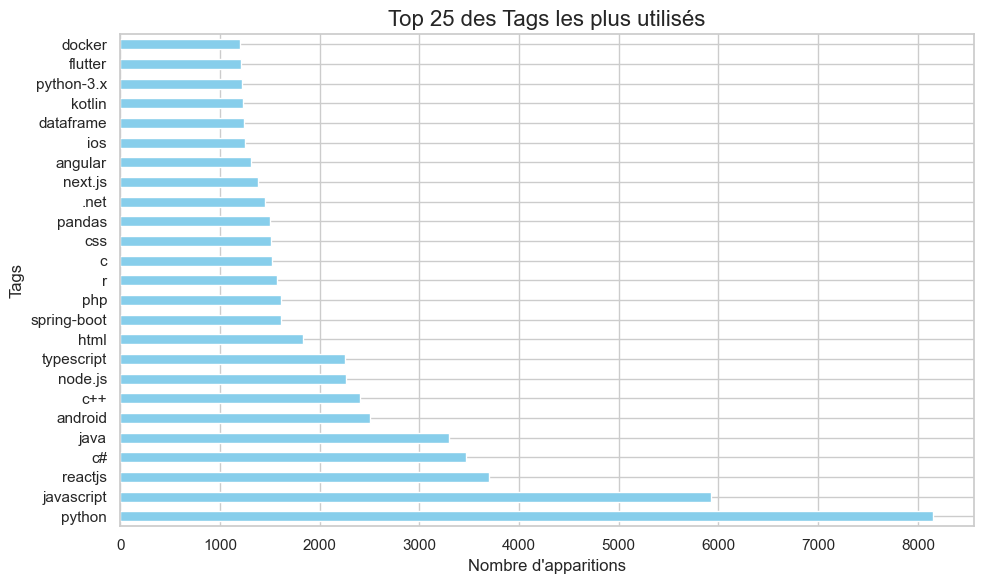

In [23]:

# Somme des colonnes (nombre d'apparitions de chaque tag)
column_sum = df2.sum(axis=0)

# Trier les tags par leur nombre total d'apparition dans tout le DataFrame
sorted_column_sum = column_sum.sort_values(ascending=False)

# Sélectionner les 25 premiers tags les plus fréquents
top_25_tags = sorted_column_sum.head(25)

# Créer un histogramme horizontal des 25 tags les plus fréquents
plt.figure(figsize=(10, 6))
top_25_tags.plot(kind='barh', color='skyblue')

# Ajouter un titre et des labels
plt.title('Top 25 des Tags les plus utilisés', fontsize=16)
plt.xlabel('Nombre d\'apparitions', fontsize=12)
plt.ylabel('Tags', fontsize=12)

# Afficher l'histogramme
plt.tight_layout()
plt.show()


Python arrive en tête avec un score de 3.2% ! Il y a 19277 différents Tags et chaque Tag apparait presque 13 fois en moyenne.<br>
Cela montre la l'immense variété de Tags utilisés par les internautes.

**Pour la suite, nous ne garderons que 100 Tags les + fréquents.**

In [24]:
# Somme des colonnes (nombre d'apparitions de chaque tag)
column_sum = df2.sum(axis=0)

# Trier les tags par leur nombre total d'apparition dans tout le DataFrame (en ordre décroissant)
sorted_column_sum = column_sum.sort_values(ascending=False)

# Sélectionner les 100 tags les plus fréquents
top_100_tags = sorted_column_sum.head(100)

# Filtrer df2 pour ne garder que les 100 colonnes les plus fréquentes
df2_filtered_100 = df2[top_100_tags.index]

# Afficher les premières lignes du DataFrame filtré
df2_filtered_100

,python,javascript,reactjs,c#,java,android,c++,node.js,typescript,html,spring-boot,php,r,c,css,pandas,.net,next.js,angular,ios,dataframe,kotlin,python-3.x,flutter,docker,azure,spring,swift,amazon-web-services,asp.net-core,react-native,arrays,sql,postgresql,django,json,linux,wordpress,firebase,woocommerce,vue.js,dart,numpy,windows,excel,android-jetpack-compose,swiftui,laravel,mongodb,performance,express,google-cloud-platform,algorithm,.net-core,database,selenium-webdriver,multithreading,assembly,authentication,machine-learning,vite,asp.net,pyspark,string,macos,go,unit-testing,gradle,jquery,docker-compose,powershell,apache-spark,xcode,powerbi,blazor,vuejs3,npm,list,kubernetes,visual-studio-code,react-hooks,function,mysql,hibernate,expo,sql-server,pytorch,bash,testing,next.js13,android-studio,aws-lambda,gcc,matplotlib,rust,maven,web-scraping,tensorflow,azure-devops,c++20
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
49996,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
49997,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
49998,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


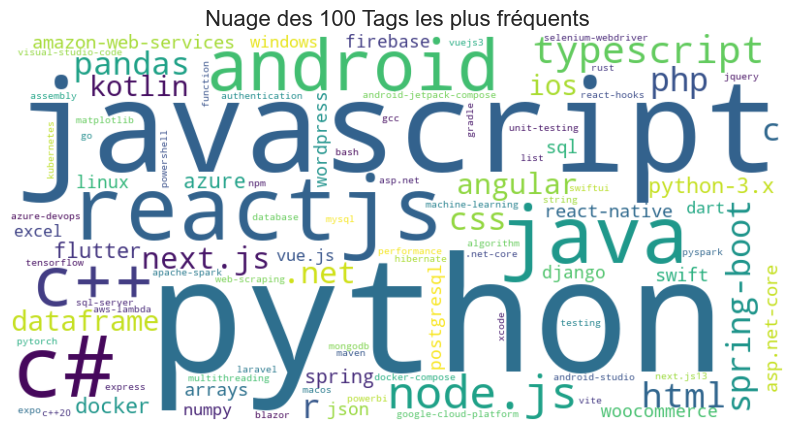

In [25]:

# Créer une série avec les tags et leur fréquence d'apparition
tag_frequencies = top_100_tags

# Créer un dictionnaire de tags et leurs fréquences
tag_dict = dict(tag_frequencies)

# Créer le nuage de mots
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(tag_dict)

# Afficher le nuage de mots
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Pas d'axes
plt.title('Nuage des 100 Tags les plus fréquents', fontsize=16)
plt.show()


## 2.2. Analyse bivariée

**ViewCount et Ancienneté**

Dans cette analyse, nous cherchons à examiner si la propension de ViewCount augmente avec le temps. Nous formulons l'hypothèse selon laquelle le nombre de vues pourrait suivre une tendance croissante en fonction de la date de création des questions ou des réponses. Cette analyse peut nous aider à comprendre si des facteurs temporels influencent directement l'engagement avec les contenus (par exemple, plus une question est ancienne, plus elle reçoit de vues, ou inversement).<br>

Pour tester cette hypothèse, nous allons observer la relation entre ViewCount et la date de création des éléments dans notre base de données. Un nuage de points (scatter plot) nous permettra de visualiser cette évolution et d'identifier d'éventuelles tendances ou variations dans le temps.

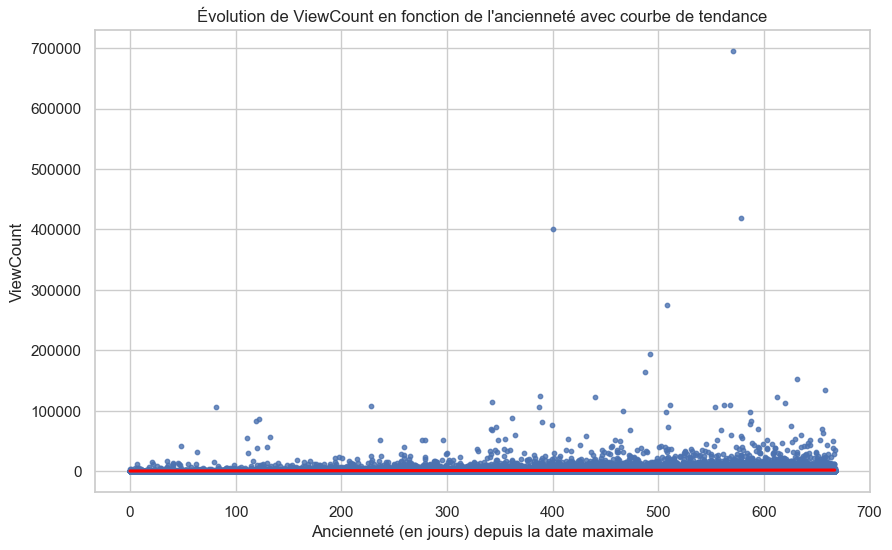

In [26]:
# Assurer que la colonne 'CreationDate' est bien au format datetime
df0['CreationDate'] = pd.to_datetime(df0['CreationDate'])

# Trouver la date maximale dans 'CreationDate'
max_date = df0['CreationDate'].max()

# Calculer l'ancienneté en jours (ou années) depuis la date maximale
df0['Anciennete'] = (max_date - df0['CreationDate']).dt.days

# Créer une figure pour le nuage de points avec la courbe de tendance
plt.figure(figsize=(10, 6))

# Utiliser regplot pour ajouter une courbe de tendance en fonction de l'ancienneté
sns.regplot(data=df0, x='Anciennete', y='ViewCount', scatter_kws={'s': 10}, line_kws={'color': 'red'})

# Ajouter les labels et le titre
plt.xlabel('Ancienneté (en jours) depuis la date maximale')
plt.ylabel('ViewCount')
plt.title('Évolution de ViewCount en fonction de l\'ancienneté avec courbe de tendance')

# Afficher le graphique
plt.show()


In [27]:
import scipy.stats as stats

# Assurer que la colonne 'CreationDate' est bien au format datetime
df0['CreationDate'] = pd.to_datetime(df0['CreationDate'])

# Trouver la date maximale dans 'CreationDate'
max_date = df0['CreationDate'].max()

# Calculer l'ancienneté en jours (ou années) depuis la date maximale
df0['Anciennete'] = (max_date - df0['CreationDate']).dt.days

# Calculer le coefficient de corrélation de Pearson et la p-valeur
correlation, p_value = stats.pearsonr(df0['Anciennete'], df0['ViewCount'])

# Afficher les résultats
print("--------------------------------------------------")
print("Test statistique de corrélation linéaire de Pearson entre CreationDateTimeDelta et ViewCount")
print()
print(f"Coefficient de corrélation linéaire de Pearson: {correlation}")
print(f"p-valeur: {p_value}")
print()
if p_value < 0.05:
    print("L'hypothèse H0 d'indépendance peut être rejetée avec un risque de 5%")
else:
    print("L'hypothèse H0 d'indépendance ne peut pas être rejetée à un niveau de signification de 5%")
print("--------------------------------------------------")


--------------------------------------------------
Test statistique de corrélation linéaire de Pearson entre CreationDateTimeDelta et ViewCount

Coefficient de corrélation linéaire de Pearson: 0.07098468187886081
p-valeur: 7.163852784322416e-57

L'hypothèse H0 d'indépendance peut être rejetée avec un risque de 5%
--------------------------------------------------


Coefficient de Pearson = 0.0710<br>
La corrélation linéaire est très faible (proche de 0).<br>
Cela signifie que l'ancienneté n'explique quasiment pas de façon linéaire l'évolution du nombre de vues.<br>

P-valeur = 7.16e-57 pour ne pas dire 0.000 (extrêmement faible)<br>
On rejette H0, donc il y a bien une relation statistiquement significative entre anciennete et ViewCount.<br>
Cependant, la faible valeur du coefficient montre que cette relation n'est pas linéaire.<br>

In [28]:
from scipy.stats import spearmanr

# Calcul du coefficient de Spearman
spearman_coef, spearman_p = spearmanr(df0['Anciennete'], df0['ViewCount'])

# Affichage des résultats
print("--------------------------------------------------")
print("Test statistique de corrélation de rang de Spearman entre anciennete et ViewCount\n")
print(f"Coefficient de Spearman: {spearman_coef:.4f}")
print(f"P-valeur: {spearman_p:.4e}\n")

# Interprétation statistique
if spearman_p < 0.05:
    print("L'hypothèse H0 d'indépendance peut être rejetée avec un risque de 5%.")
else:
    print("On ne peut pas rejeter l'hypothèse d'indépendance au seuil de 5%.")


--------------------------------------------------
Test statistique de corrélation de rang de Spearman entre anciennete et ViewCount

Coefficient de Spearman: 0.2772
P-valeur: 0.0000e+00

L'hypothèse H0 d'indépendance peut être rejetée avec un risque de 5%.


Coefficient de Spearman = 0.2772<br>
Il y a une corrélation positive faible à modérée entre l'ancienneté (anciennete) et le nombre de vues (ViewCount).<br>
Cela signifie que plus un post est ancien, plus il a tendance à avoir de vues, mais ce n’est pas une règle absolue.<br>

P-valeur = 0.0000<br>
La p-valeur est extrêmement faible (< 0.05), donc on peut rejeter l'hypothèse d'indépendance (H0).<br>
Autrement dit, l'ancienneté influence bien le nombre de vues.<br>

Etant donné qu'il y a une relation de cause à effet, on va essayer de creuser un peu plus en regardant le nombre de vues pas jour.<br>
On l'appellera '"ViewCountDaily"

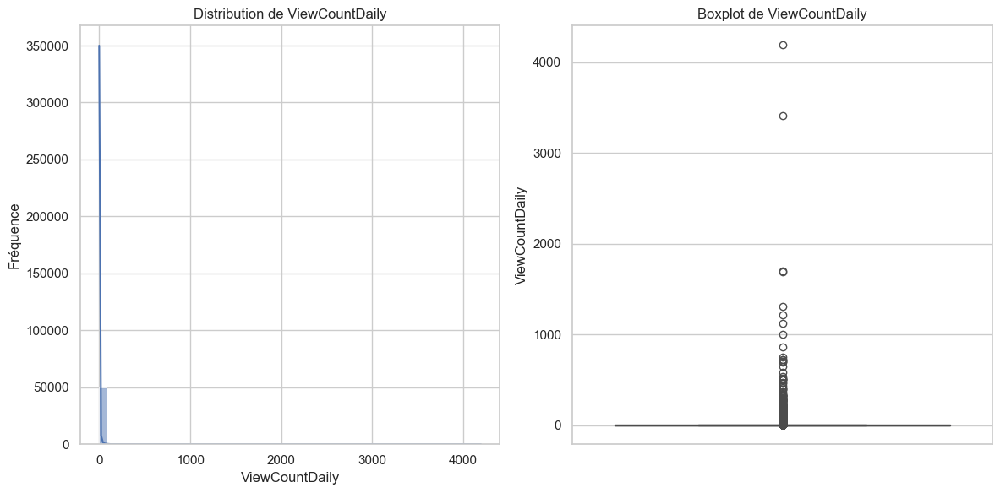

Top 10 des posts avec le plus grand ViewCountDaily :
       ViewCountDaily        CreationDate  Anciennete  ViewCount
49976     4192.000000 2024-10-29 03:01:01           1       4192
49955     3411.000000 2024-10-28 11:56:36           1       3411
49757     1697.428571 2024-10-21 19:52:34           7      11882
49962     1693.000000 2024-10-28 16:12:23           1       1693
47301     1307.543210 2024-08-09 03:29:31          81     105911
13324     1217.211909 2023-04-07 07:05:59         571     695028
49828     1120.800000 2024-10-23 19:33:05           5       5604
28764     1002.505000 2023-09-25 09:05:11         400     401002
48417      859.875000 2024-09-10 18:31:26          48      41274
49760      754.142857 2024-10-21 21:09:30           7       5279
count    50000.000000
mean         4.255049
std         33.263670
min          0.076807
25%          0.472385
50%          1.188291
75%          2.906279
max       4192.000000
Name: ViewCountDaily, dtype: float64


In [29]:
# Assurer que 'CreationDate' est bien en format datetime
df0['CreationDate'] = pd.to_datetime(df0['CreationDate'])

# Éviter la division par zéro en remplaçant les anciennetés nulles par 1 jour
df0['Anciennete'] = df0['Anciennete'].replace(0, 1)

# Calculer ViewCountDaily (nombre de vues par jour)
df0['ViewCountDaily'] = df0['ViewCount'] / df0['Anciennete']

# -------------------------------

# Visualisation de la distribution de ViewCountDaily
plt.figure(figsize=(12, 6))

# Histogramme
plt.subplot(1, 2, 1)
sns.histplot(df0['ViewCountDaily'], bins=50, kde=True)
plt.xlabel('ViewCountDaily')
plt.ylabel('Fréquence')
plt.title('Distribution de ViewCountDaily')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=df0['ViewCountDaily'])
plt.ylabel('ViewCountDaily')
plt.title('Boxplot de ViewCountDaily')

plt.tight_layout()
plt.show()

# -------------------------------

# Afficher les 10 posts les plus performants en termes de vues par jour
top_posts = df0[['ViewCountDaily', 'CreationDate', 'Anciennete', 'ViewCount']].copy()

# Trier en ordre décroissant
top_posts = top_posts.sort_values(by='ViewCountDaily', ascending=False).head(10)

print("Top 10 des posts avec le plus grand ViewCountDaily :")
print(top_posts)

# -------------------------------

print(df0['ViewCountDaily'].describe())

Visualisons la relation entre l'ancienneté et les vues par jour.<br>
Détectons les posts qui ont des performances anormales.

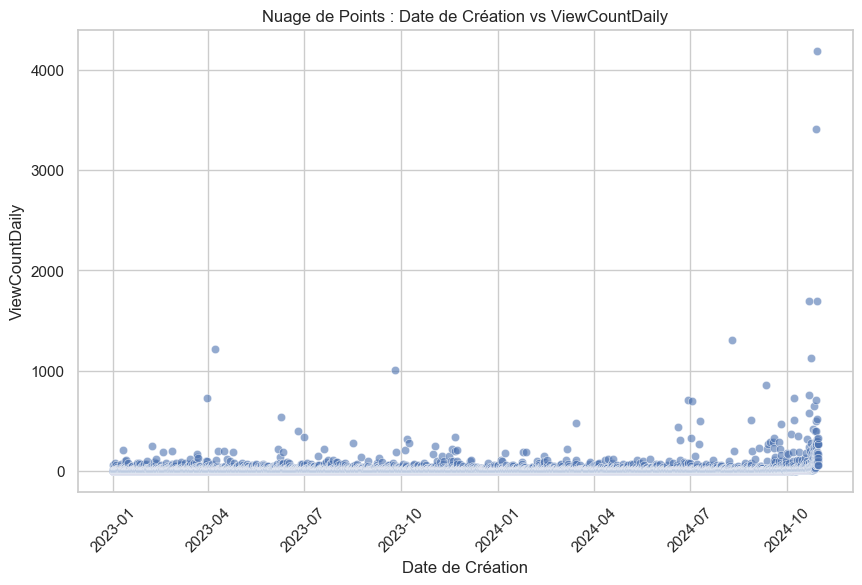

In [30]:
# Créer un nuage de points entre CreationDate et ViewCountDaily
plt.figure(figsize=(10, 6))

sns.scatterplot(data=df0, x='CreationDate', y='ViewCountDaily', alpha=0.6)

# Ajouter les labels et le titre
plt.xlabel('Date de Création')
plt.ylabel('ViewCountDaily')
plt.title('Nuage de Points : Date de Création vs ViewCountDaily')

# Rotation des ticks pour mieux visualiser les dates
plt.xticks(rotation=45)
plt.show()

On peut constater qu'il y a un pic en octobre 2024.

Visualisons les relations entre plusieurs variables simultanément et pour identifier d'éventuelles corrélations ou tendances,
à l'aide d'un pairplot et d'une matrice de corrélation de Pearson.

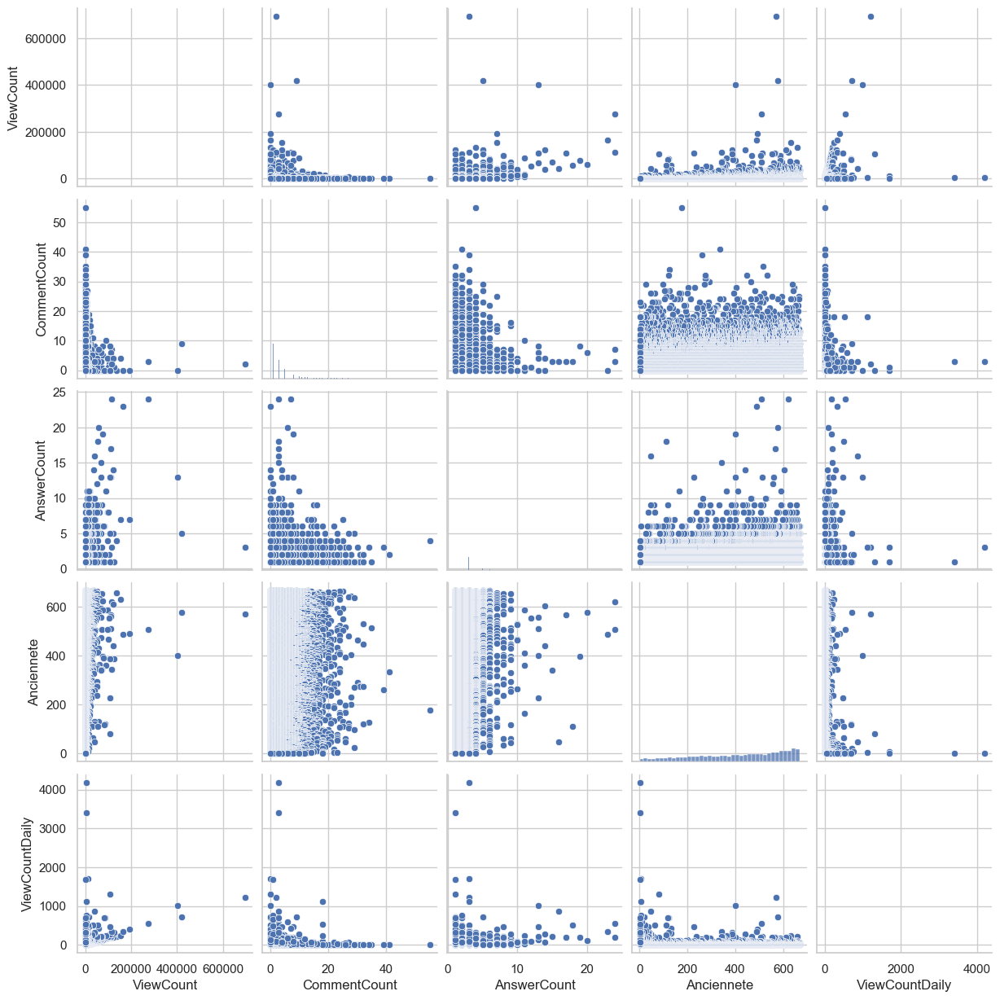

In [31]:

# Sélectionner les colonnes spécifiques pour le pairplot

selected_columns = ['ViewCount', 'CommentCount', 'AnswerCount', 'Anciennete', 'ViewCountDaily']

# Créer un pairplot avec les colonnes sélectionnées sans la densité de noyau
sns.pairplot(df0[selected_columns], kind='scatter')

# Afficher le graphique
plt.show()



## 2.3 Analyse Multivariée

**Entre AnswerCount, ViewCounts et CommentCount** (Il n'y a pas eu de filtres sur CommentCount à l'extraction)

In [32]:
print(df0['ViewCount'].describe())

count     50000.000000
mean       1284.322820
std        5813.069049
min          51.000000
25%         143.000000
50%         398.000000
75%        1048.000000
max      695028.000000
Name: ViewCount, dtype: float64


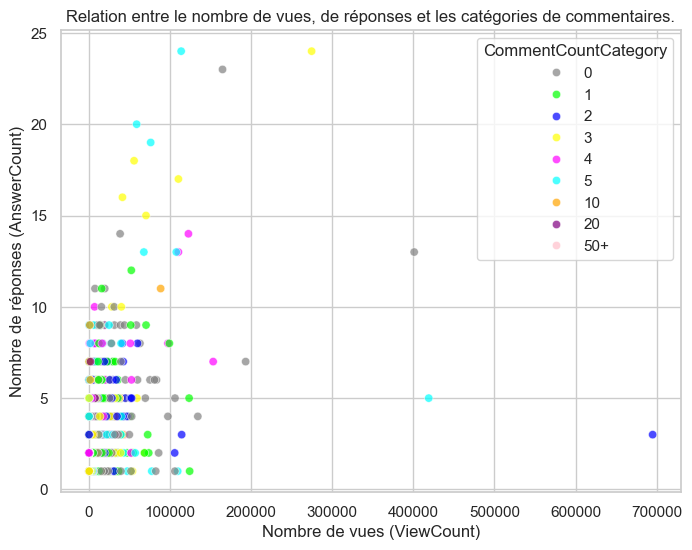

In [33]:


# Créer des intervalles pour 'CommentCount'
bins = [0, 1, 2, 3, 4, 5, 10, 20, 50, float('inf')]  # Définir les intervalles
labels = ['0', '1', '2', '3', '4', '5', '10', '20', '50+']  # Étiquettes des intervalles
df0['CommentCountCategory'] = pd.cut(df0['CommentCount'], bins=bins, labels=labels, right=False)

# Définir une palette de couleurs avec des couleurs complètement différentes
custom_palette = ['gray', '#00FF00', '#0000FF', '#FFFF00', '#FF00FF', '#00FFFF', '#FFA500', '#800080', '#FFC0CB']

# Créer le scatter plot en coloriant en fonction des catégories de 'CommentCount'
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df0, x='ViewCount', y='AnswerCount', hue='CommentCountCategory', palette=custom_palette, alpha=0.7)

# Ajouter les labels et le titre
plt.xlabel("Nombre de vues (ViewCount)")
plt.ylabel("Nombre de réponses (AnswerCount)")
plt.title("Relation entre le nombre de vues, de réponses et les catégories de commentaires.")

# Afficher la figure
plt.show()



**Radars des 7 Top_Tags (Tags les plus rencontrés en nombre)**

In [34]:
# Filtrer df2 pour garder uniquement les colonnes des tags spécifiés
tags_of_interest = ['python', 'javascript', 'reactjs', 'c#', 'java', 'android', 'c++']
df2_filtered = df2[tags_of_interest]

# Sélectionner les colonnes de df0 qui nous intéressent
df0_filtered = df0[['Score', 'ViewCount', 'CommentCount', 'AnswerCount']]

# Sélectionner les colonnes de df1 qui nous intéressent
df1_filtered = df1[['Body_length_word', 'Title_length_word']]

# Fusionner df2_filtered, df0_filtered et df1_filtered pour créer df3
df3 = pd.concat([df2_filtered, df0_filtered, df1_filtered], axis=1)

# Afficher les premières lignes de df3
df3


,python,javascript,reactjs,c#,java,android,c++,Score,ViewCount,CommentCount,AnswerCount,Body_length_word,Title_length_word
0,0,0,0,0,1,0,0,2,80,3,1,259,10
1,0,0,0,0,0,1,0,1,308,4,1,160,5
2,0,0,0,0,0,0,0,2,1153,2,1,470,8
3,0,0,0,0,0,0,0,1,60,0,2,171,9
4,1,0,0,0,0,0,0,3,1787,0,1,167,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,1,0,0,0,0,0,0,2,269,1,1,118,8
49996,0,1,0,0,0,0,0,1,128,0,1,524,9
49997,0,0,0,0,0,0,0,4,268,10,1,106,15
49998,0,0,0,0,0,0,0,2,57,4,2,115,7


In [35]:
# Filtrer df2 pour garder uniquement les colonnes des tags spécifiés
tags_of_interest = ['python', 'javascript', 'reactjs', 'c#', 'java', 'android', 'c++']
df2_filtered = df2[tags_of_interest]

# Sélectionner les colonnes de df0 qui nous intéressent
df0_filtered = df0[['Score', 'ViewCountDaily', 'CommentCount', 'AnswerCount']]

# Sélectionner les colonnes de df1 qui nous intéressent
df1_filtered = df1[['Body_length_word', 'Title_length_word']]

# Fusionner df2_filtered, df0_filtered et df1_filtered pour créer df3
df3 = pd.concat([df2_filtered, df0_filtered, df1_filtered], axis=1)

# Créer un DataFrame df4 pour ajouter une colonne "Autres_Tags"
df3['Autres_Tags'] = df3[tags_of_interest].sum(axis=1) == 0

# Afficher les premières lignes de df3
df3.head()

,python,javascript,reactjs,c#,java,android,c++,Score,ViewCountDaily,CommentCount,AnswerCount,Body_length_word,Title_length_word,Autres_Tags
0,0,0,0,0,1,0,0,2,0.119940,3,1,259,10,False
1,0,0,0,0,0,1,0,1,0.461769,4,1,160,5,False
2,0,0,0,0,0,0,0,2,1.728636,2,1,470,8,True
3,0,0,0,0,0,0,0,1,0.089955,0,2,171,9,True
4,1,0,0,0,0,0,0,3,2.679160,0,1,167,3,False


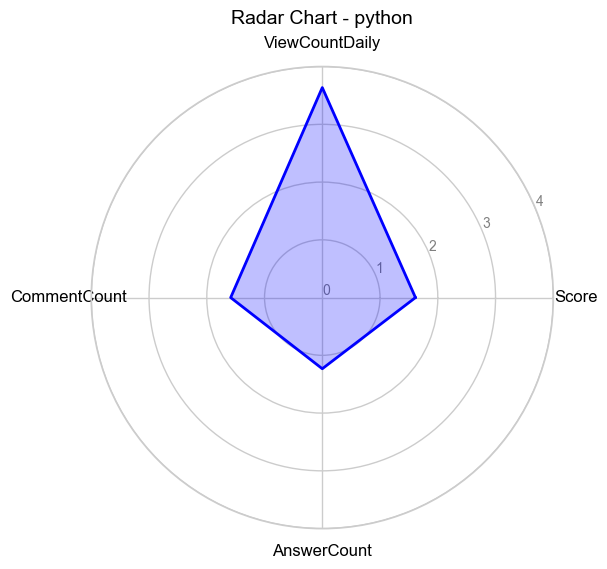

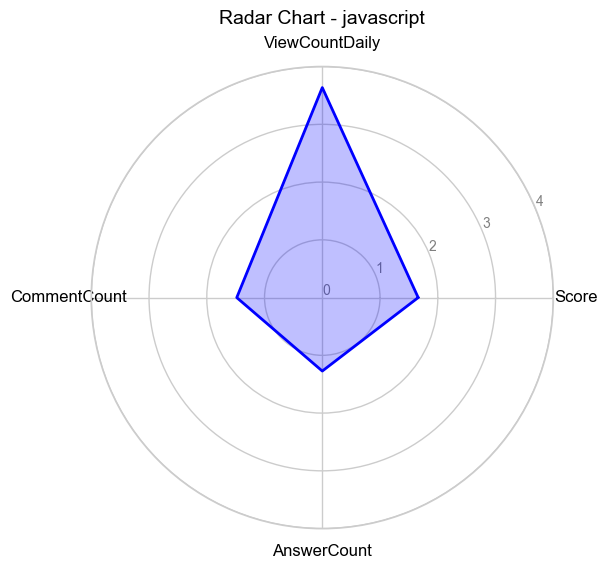

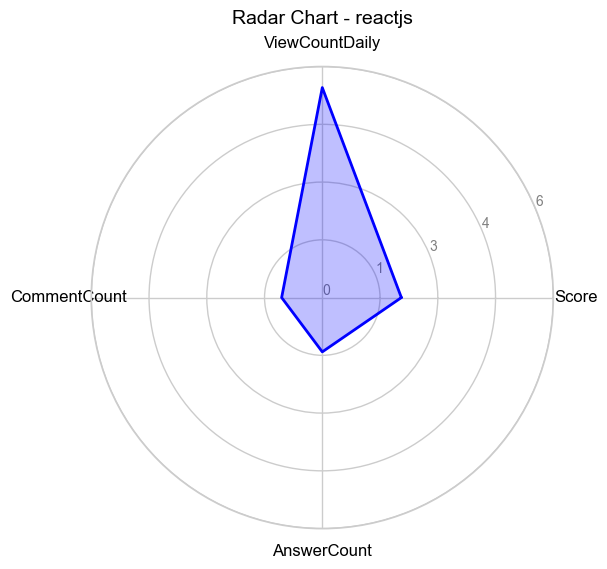

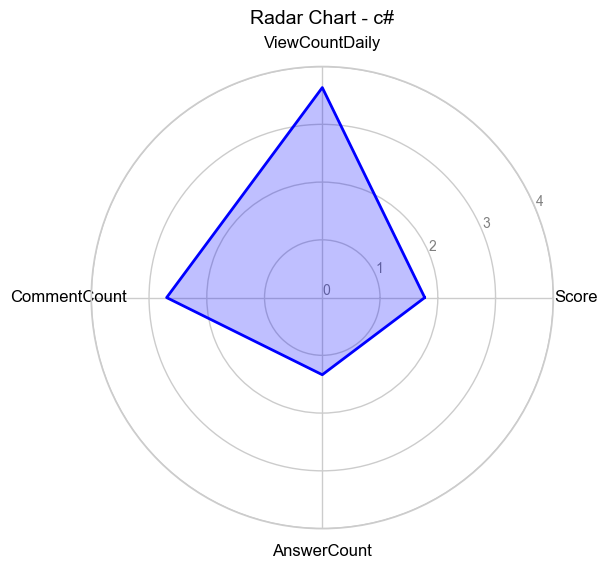

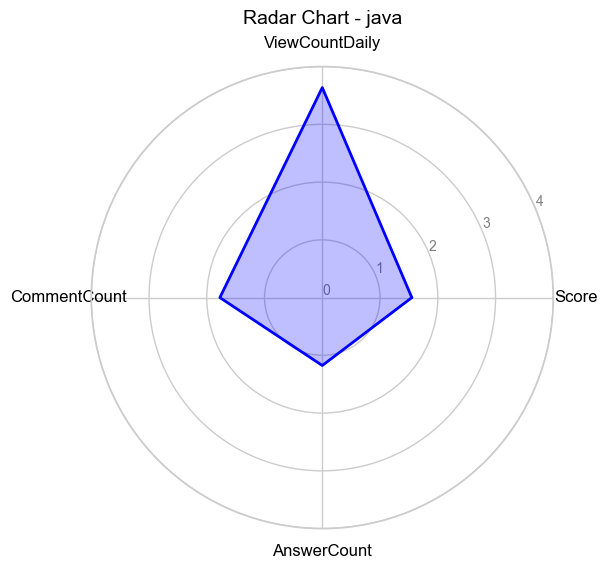

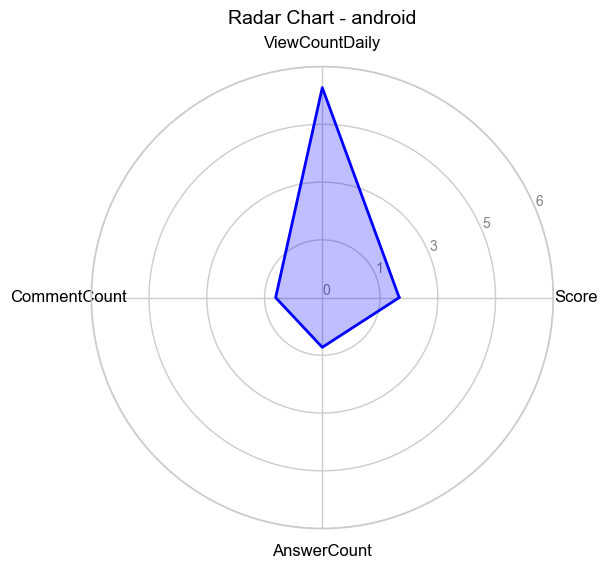

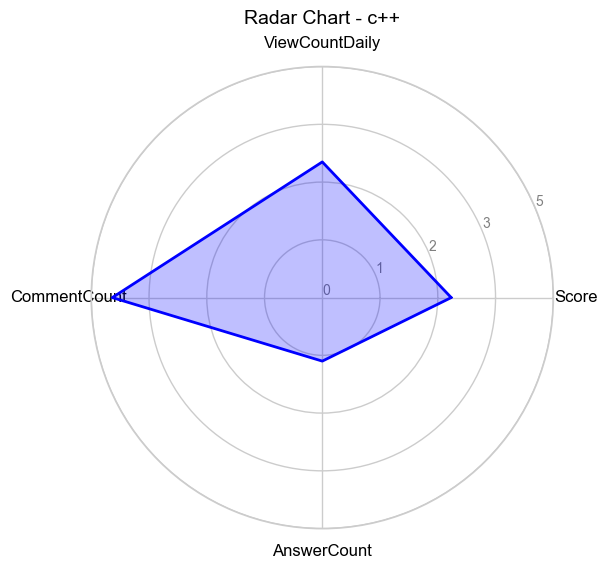

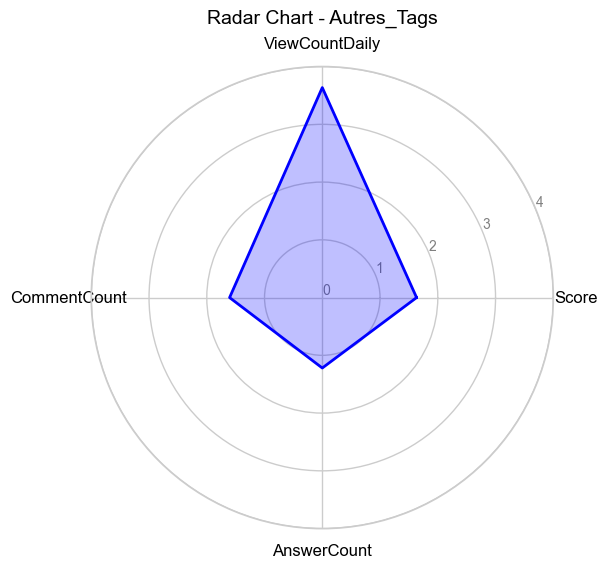

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# Fonction pour créer un radar chart avec échelle
def create_radar_chart(df, tag_name, variables):
    # Extraire les données pour le tag spécifique
    values = df[variables].loc[df[tag_name] == 1].mean()  # Moyenne pour les valeurs associées au tag
    values = values.values.flatten().tolist()  # Conversion des valeurs en liste
    
    # Ajouter la première valeur pour fermer le radar
    values += values[:1]
    
    # Vérifier que le nombre de valeurs et de catégories est correct
    N = len(variables)
    angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
    angles += angles[:1]  # Fermer le radar
    
    # Définir des valeurs d'échelle pour le radar
    max_value = max(values) * 1.1  # Légèrement au-dessus du max pour l'esthétique
    yticks = np.linspace(0, max_value, num=5)  # 5 niveaux de repère

    # Création du radar
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    ax.fill(angles, values, color='blue', alpha=0.25)
    ax.plot(angles, values, color='blue', linewidth=2)  # Contour

    # Ajouter les étiquettes des axes
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(variables, fontsize=12, color='black')

    # Ajouter les niveaux d'échelle
    ax.set_yticks(yticks)
    ax.set_yticklabels([f"{int(y)}" for y in yticks], fontsize=10, color='gray')
    ax.set_ylim(0, max_value)  # Limite de l'échelle

    # Titre du graphique
    ax.set_title(f"Radar Chart - {tag_name}", size=14, color='black', verticalalignment='bottom')

    # Afficher le graphique
    plt.show()

# Variables à utiliser pour les radars
variables = ['Score', 'ViewCountDaily', 'CommentCount', 'AnswerCount']

# Ajouter "Autres_Tags" à la liste des tags
tags_of_interest.append('Autres_Tags')

# Générer un radar pour chaque tag
for tag in tags_of_interest:
    create_radar_chart(df3, tag, variables)


In [37]:
# Liste des variables à analyser
variables = ['Score', 'ViewCountDaily', 'CommentCount', 'AnswerCount', 'Body_length_word', 'Title_length_word']

# Créer un DataFrame pour stocker les moyennes par tag
summary_table = pd.DataFrame(columns=variables)

# Ajouter les moyennes pour chaque tag
for tag in tags_of_interest:
    summary_table.loc[tag] = df3.loc[df3[tag] == 1, variables].mean()

# Afficher le tableau récapitulatif
summary_table

,Score,ViewCountDaily,CommentCount,AnswerCount,Body_length_word,Title_length_word
python,1.898958,4.279736,1.867075,1.450153,262.548375,10.655058
javascript,1.883635,4.125100,1.680122,1.443168,258.360581,10.929235
reactjs,2.150689,5.711495,1.105590,1.476371,270.591952,10.988658
c#,1.802829,3.695665,2.739319,1.357679,250.467379,10.885681
java,1.861912,4.366883,2.129590,1.412443,266.549621,10.656146
android,2.299162,6.276338,1.394097,1.486239,252.394495,10.767451
c++,2.860533,3.010090,4.659450,1.409659,290.554122,10.878435
Autres_Tags,1.868527,4.161375,1.837003,1.395493,252.174652,10.907234


**Matrice de corrélation** (récupération de quelques features engineering numériques)

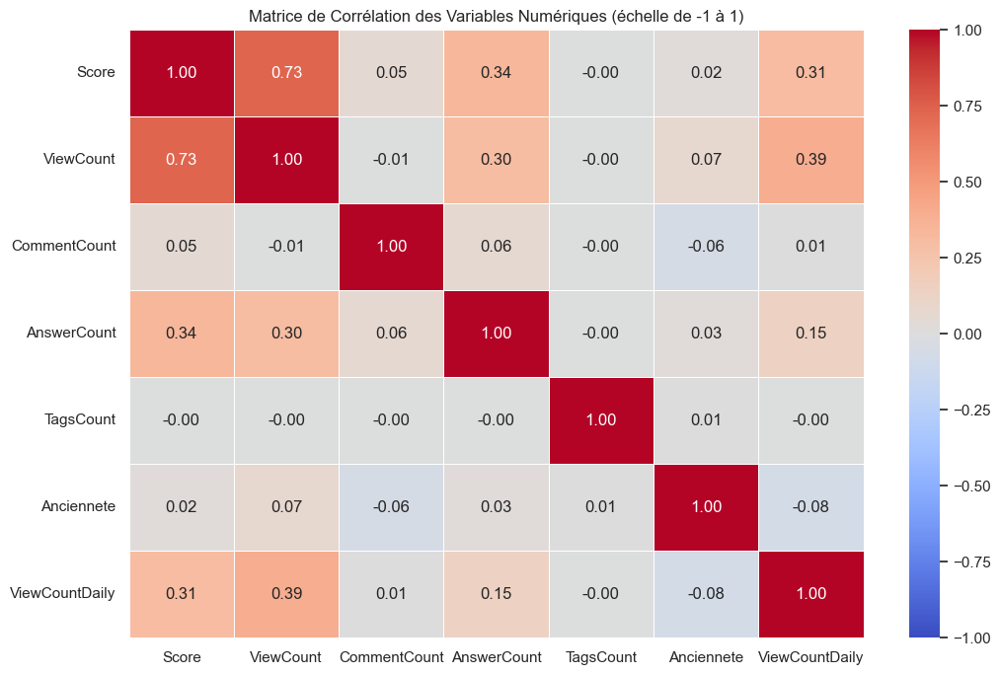

In [38]:

# Sélectionner uniquement les colonnes numériques et exclure 'Id'
df0_numeric = df0.select_dtypes(include=['number']).drop(columns=['PostTypeId', 'Id'], errors='ignore')

# Calcul de la matrice de corrélation
corr_matrix = df0_numeric.corr()

# Affichage de la heatmap avec une échelle de -1 à 1
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5, vmin=-1, vmax=1)

plt.title("Matrice de Corrélation des Variables Numériques (échelle de -1 à 1)")
plt.show()



0 <= r < |0.3| : Corrélation faible (positive ou négative)<br>
|0.3| <= r < |0.7| : Corrélation modérée (positive ou négative)<br>
|0.7| <= r < |1| : Corrélation forte (positive ou négative)<br>


## 3. Fusion de Title et Body

Fusion de Title et Body, on crééra une feature Tags (nombre de fois ou les Tags sont rencontré dans le texte) ultérieurement.

In [39]:
pd.set_option('display.max_columns', 20)  # Affiche jusqu'à 20 colonnes pour ne pas surcharger le notebook.


In [40]:
# Créer df5 avec l'ID en première colonne et le titre et le corps combinés
df5 = pd.DataFrame({
    'Id': df0['Id'],
    'Title_Body': df0['Title'] + '\n' + df0['Body']  # Combiner Title et Body avec un retour à la ligne
})

# Afficher les premières lignes pour vérifier
df5.head()

,Id,Title_Body
0,74972603,Optimized way to filter and return objects in ...
1,74972777,LiveData observer is not removed\n<p>I am tryi...
2,74972784,MAUI ContentView can't inherit from custom bas...
3,74972800,My if statement is not working in React Native...
4,74972850,jax.lax.select vs jax.numpy.where\n<p>Was taki...


In [41]:
# Afficher le contenu complet de la première cellule dans la colonne 'Title_Body' pour y jeter un coup d'oeil
print(df5.loc[0, 'Title_Body']) 

Optimized way to filter and return objects in Java 7
<p>I have the following Movie class -</p>
<pre><code>class Movie{

    private String genre;
    private String title;
    private Date releaseDate;

    Movie(String genre, String title, Date releaseDate){
        this.genre = genre;
        this.title = title;
        this.releaseDate = releaseDate;
    }

    void setGenre(String genre){
        this.genre = genre;
    }
    void setTitle(String title){
        this.title = title;
    }
    void setReleaseDate(Date releaseDate){
        this.releaseDate = releaseDate;
    }
    String getGenre(){
        retuen genre;
    }
    String getTitle(){
        return title;
    }
    Date getReleaseDate(){
        return releaseDate;
    }
}
</code></pre>
<p>I have the following requirements -</p>
<ol>
<li>Create a catalog to store all &quot;Movie&quot; objects (can be of any time complexity)</li>
<li>Create a method to return all movies of a certain genre, and time period from the cata

## 3.1. Nettoyage

1) Retirer les balises HTML (BeautifulSoup)<br>
2) Mettre en minuscules (méthode lower)<br>
3) Supprimer la ponctuation et les caractères spéciaux (re)<br>
4) Supprimer les stopwords (NLTK pour les mots couramment utilisés (ex. a, an, the)<br>
5) Lemmatisation (réduction des mots à leur forme de base : NLTK )<br>

A CONSERVER
# Télécharger les stopwords : téléchargement
nltk.download('stopwords')  # Liste des mots vides à supprimer
nltk.download('punkt')  # découpage du texte en tokens
nltk.download('wordnet')  # Base de données lexicale pour la lemmatisation

# Initialiser le Lemmatizer
lemmatizer = WordNetLemmatizer()

# Charger les stopwords et nlp
stop_words = set(stopwords.words('english'))
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])  # Désactive l'analyse syntaxique et la reconnaissance d'entités

# Liste pour stocker les mots trop longs supprimés
long_words_removed = []

# Fonction de nettoyage optimisée
def clean_text(text, max_length=18, allowed_postags=['NOUN', 'VERB', 'ADJ', 'ADV']):
    global long_words_removed  # Utiliser la variable globale pour accumuler les mots supprimés
    # 1. Retirer les balises HTML avec BeautifulSoup
    text = BeautifulSoup(text, "html.parser").get_text(separator=" ")

    # 2. Mettre en minuscules
    text = text.lower()

    # 3. Supprimer la ponctuation et les caractères spéciaux (y compris les \n et quelques caractères rajoutés)
    text = re.sub(r'[^\w\s]', ' ', text)  # Retire la ponctuation sans la remplacer par rien, mais plutôt par un espace pour ceux qui ne respectent pas les espaces
    text = re.sub(r'\n', ' ', text)  # Retire les sauts de ligne
    text = re.sub(r'\d+', ' ', text)  # Supprime tous les chiffres ou nombres

    # 4. Supprimer les stopwords
    text = ' '.join([word for word in text.split() if word not in stop_words])

    # 4.5. Supprimer les espaces multiples
    text = re.sub(r'\s+', ' ', text).strip()  # Supprime les espaces multiples pour n'en faire qu'un
    
    # 5. Filtrage des mots trop longs et concaténés (longueur > max_length ou contenant des underscores, assimilé à des variables par ex.)
    words = text.split()
    words_to_keep = []
    
    # Utiliser une boucle pour extraire les mots longs à supprimer
    for word in words:
        if len(word) <= max_length and "_" not in word:
            words_to_keep.append(word)
        else:
            long_words_removed.append(word)  # Ajouter les mots supprimés à la liste

    text = ' '.join(words_to_keep)

    # 6. Lemmatisation
    doc = nlp(text)
    text = ' '.join([token.lemma_ for token in doc if token.pos_ in allowed_postags])

    return text

# Appliquer la fonction de nettoyage à la colonne 'Title_Body' de df5
df5['Cleaned_Title_Body'] = df5['Title_Body'].apply(clean_text)

# Afficher un aperçu des résultats
print(df5[['Title_Body', 'Cleaned_Title_Body']].head())

# Afficher les mots trop longs supprimés
print(f"Exemple de mots trop longs supprimés : {long_words_removed[:50]}")

# Convertir la liste des mots supprimés en un ensemble pour éliminer les doublons
unique_long_words = set(long_words_removed)

# Afficher le nombre de mots uniques supprimés
print(f"Nombre de mots trop longs uniques supprimés : {len(unique_long_words)}")

In [43]:

# Télécharger les stopwords : téléchargement
nltk.download('stopwords')  # Liste des mots vides à supprimer
nltk.download('punkt')  # découpage du texte en tokens
nltk.download('wordnet')  # Base de données lexicale pour la lemmatisation

# Initialiser le Lemmatizer
lemmatizer = WordNetLemmatizer()

# Charger les stopwords et nlp
stop_words = set(stopwords.words('english'))
stop_words.update(['e'])
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])  # Désactive l'analyse syntaxique et la reconnaissance d'entités

# Liste pour stocker les mots trop longs supprimés
long_words_removed = []

# Fonction de nettoyage optimisée
def clean_text(text, max_length=18):
    global long_words_removed  # Utiliser la variable globale pour accumuler les mots supprimés
    # 1. Retirer les balises HTML avec BeautifulSoup
    text = BeautifulSoup(text, "html.parser").get_text(separator=" ")

    # 2. Mettre en minuscules
    text = text.lower()

    # 3. Supprimer la ponctuation et les caractères spéciaux (y compris les \n et quelques caractères rajoutés)
    text = re.sub(r'[^\w\s]', ' ', text)  # Retire la ponctuation sans la remplacer par rien, mais plutôt par un espace pour ceux qui ne respectent pas les espaces
    text = re.sub(r'\n', ' ', text)  # Retire les sauts de ligne
    text = re.sub(r'\d+', ' ', text)  # Supprime tous les chiffres ou nombres

    # 4. Supprimer les stopwords
    text = ' '.join([word for word in text.split() if word not in stop_words])

    # 4.5. Supprimer les espaces multiples
    text = re.sub(r'\s+', ' ', text).strip()  # Supprime les espaces multiples pour n'en faire qu'un
    
    # 5. Filtrage des mots trop longs et concaténés (longueur > max_length ou contenant des underscores, assimilé à des variables par ex.)
    words = text.split()
    words_to_keep = []
    
    # Utiliser une boucle pour extraire les mots longs à supprimer
    for word in words:
        if len(word) <= max_length and "_" not in word:
            words_to_keep.append(word)
        else:
            long_words_removed.append(word)  # Ajouter les mots supprimés à la liste

    text = ' '.join(words_to_keep)

    # 6. Lemmatisation (on fait une lémmatisation simple, car la lemmatisation spacy enlève les mots techniques qui ne sont ni VERB, ni NOUN, ni ADV, ni ADJ)
    doc = nlp(text)
    text = ' '.join([token.lemma_ for token in doc])

    return text

# Appliquer la fonction de nettoyage à la colonne 'Title_Body' de df5
df5['Cleaned_Title_Body'] = df5['Title_Body'].apply(clean_text)

# Afficher un aperçu des résultats
print(df5[['Title_Body', 'Cleaned_Title_Body']].head())

# Afficher les mots trop longs supprimés
print(f"Exemple de mots trop longs supprimés : {long_words_removed[:50]}")

# Convertir la liste des mots supprimés en un ensemble pour éliminer les doublons
unique_long_words = set(long_words_removed)

# Afficher le nombre de mots uniques supprimés
print(f"Nombre de mots trop longs uniques supprimés : {len(unique_long_words)}")

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ggenv\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ggenv\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ggenv\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


                                          Title_Body  \
0  Optimized way to filter and return objects in ...   
1  LiveData observer is not removed\n<p>I am tryi...   
2  MAUI ContentView can't inherit from custom bas...   
3  My if statement is not working in React Native...   
4  jax.lax.select vs jax.numpy.where\n<p>Was taki...   

                                  Cleaned_Title_Body  
0  optimize way filter return object java follow ...  
1  livedata observer remove try get livedata upda...  
2  maui contentview inherit custom base class con...  
3  statement work react native want build search ...  
4  jax lax select vs jax numpy taking look dropou...  
Exemple de mots trop longs supprimés : ['findgenretimeperiod', '_uistate', 'fragmentmusicliststate', 'oncleared_removesobserver', 'instrumentationregistry', 'fragmentmusiclistviewmodel', 'homepageorientationviewloader', 'homepageorientationviewloader', 'homepageorientationviewloader', 'orientationcontentviewloader', 'orientationcon

In [44]:
# Afficher les deux premières cellules de 'Title_Body' et 'Cleaned_Title_Body'
print(df5[['Title_Body', 'Cleaned_Title_Body']].iloc[2:3])

                                          Title_Body  \
2  MAUI ContentView can't inherit from custom bas...   

                                  Cleaned_Title_Body  
2  maui contentview inherit custom base class con...  


In [45]:
# 1 Exemple des mot trop long
# Recherche de une cellule contenant le mot "portraitcontentview" dans la colonne 'Title_Body' de df5 (il fait 19 caractères)
result = df5[df5['Title_Body'].str.contains('portraitcontentview', case=False, na=False)]

# Afficher les résultats
result[['Title_Body', 'Cleaned_Title_Body']]

,Title_Body,Cleaned_Title_Body
2,MAUI ContentView can't inherit from custom bas...,maui contentview inherit custom base class con...


In [46]:
print(df5[df5['Cleaned_Title_Body'].str.contains(r' e ', na=False)][['Title_Body', 'Cleaned_Title_Body']])
# Extraire les " e ", seuls pour connaître leur signification. EN l'occurence, c'est Exception e

                                              Title_Body  \
1524   flutter build apk --release not working after ...   
1612   Simple Breadth First Search not finding target...   
3160   No static files after deploying Django app\n<p...   
5732   Filter an array with conditions across multipl...   
5807   python text parsing to split list into chunks ...   
6177   Using fixest/etable to stack regression result...   
6223   Custom Standard Errors with Statsmodels / Star...   
11176  Polars replace_time_zone and convert_time_zone...   
13260  Event dependent change of precedence between c...   
16390  Is it possible to extract generic arguments of...   
16704  How to check if a class has one or more method...   
21054  Spring Eureka in integration tests\n<p>We have...   
22334  Is this Patricia tree implementation wrong?\n<...   
33497  What's the proper way to run a piece of code w...   
34559  Python ReportLab Table of Contents Page Number...   
34933  JS: displaying different timezone

In [47]:
# Afficher la première ligne de df5 après la tokenisation
pd.set_option('display.max_colwidth', None)
print(df5.loc[11, ['Title_Body', 'Cleaned_Title_Body']])


Title_Body            Efficient way to update a single element of a Polars DataFrame?\n<p>Polars DataFrame does not provide a method to update the value of a single cell currently. Instead, we have to the method <code>DataFrame.apply</code> or <code>DataFrame.apply_at_idx</code> that updates a whole column / Series. This can be very expensive in situations where an algorithm repeated update a few elements of some columns. Why is <code>DataFrame</code> designed in this way? Looking into the code, it seems to me that <code>Series</code> does provide inner mutability via the method <code>Series._get_inner_mut</code>?</p>\n
Cleaned_Title_Body                                                                                                                                                                                                                                                                                       efficient way update single element polar dataframe polar dataframe provide

In [48]:
pd.set_option('display.max_columns', 20) 

**Ajout des 100 Tags les + vus**

In [49]:
# Convertir toutes les colonnes de df2_filtered_100 en chaînes de caractères
df2_filtered_100_str = df2_filtered_100.astype(str)

# Reorganiser pour que Cleaned_Title_Body soit la première colonne
df5_combined = pd.concat([df5[['Cleaned_Title_Body']], df2_filtered_100_str], axis=1)

# Vérifier que le DataFrame contient bien Cleaned_Title_Body en première colonne
df5_combined.head(1)

df2_filtered_100_str

,python,javascript,reactjs,c#,java,android,c++,node.js,typescript,html,...,android-studio,aws-lambda,gcc,matplotlib,rust,maven,web-scraping,tensorflow,azure-devops,c++20
0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
49996,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


**Nuage de mots pour les 7 Tags principaux**

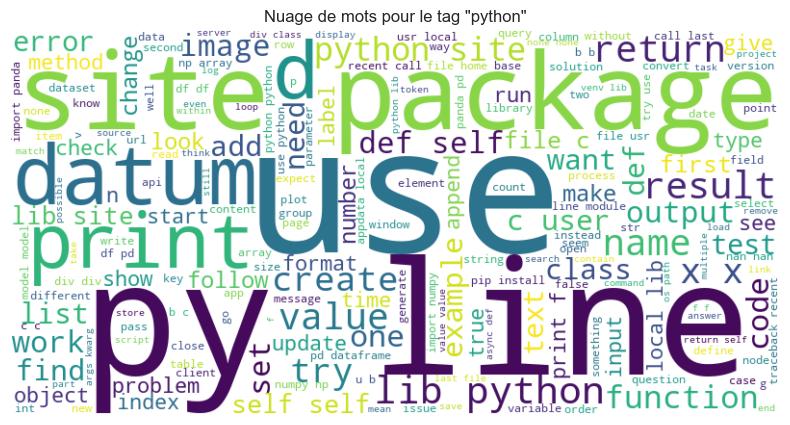

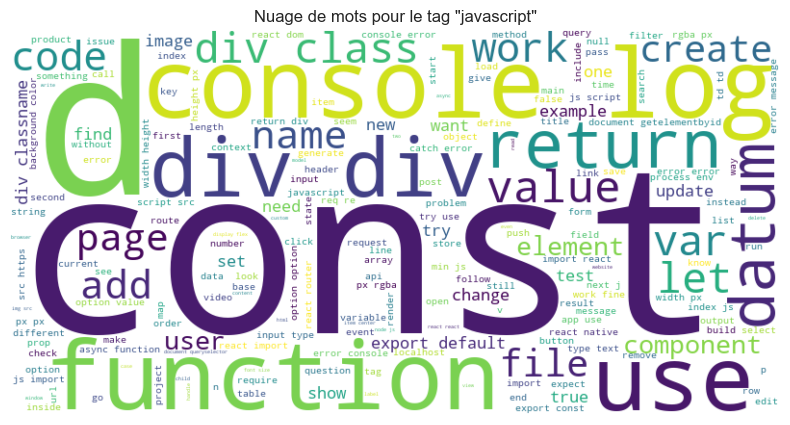

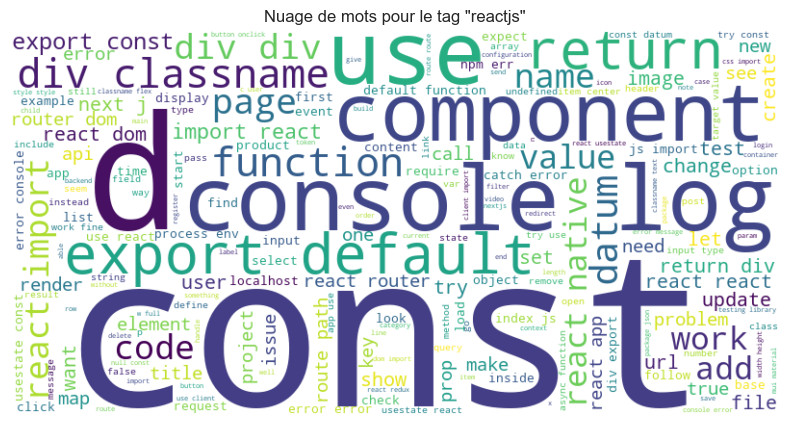

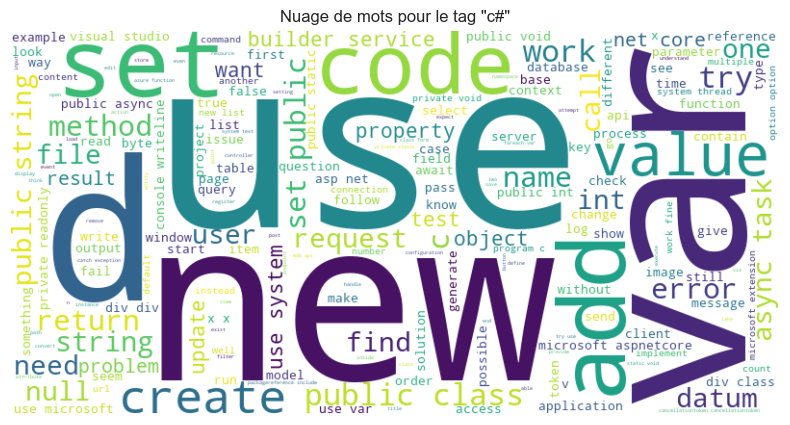

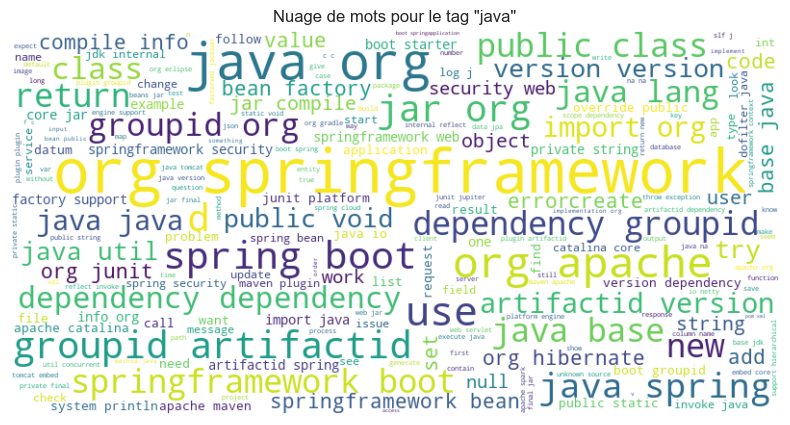

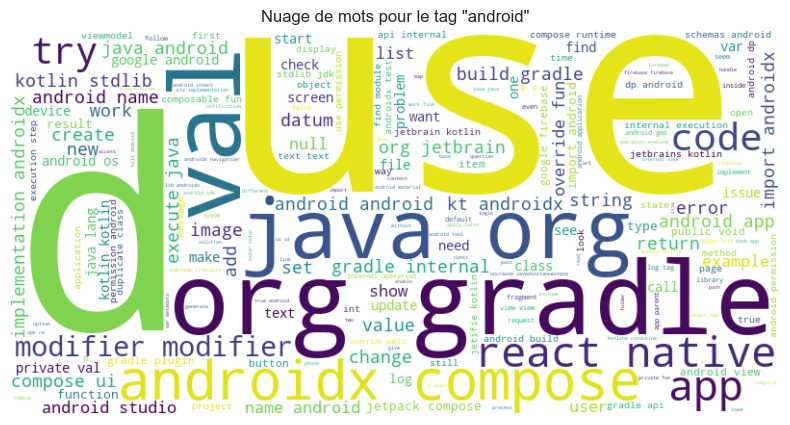

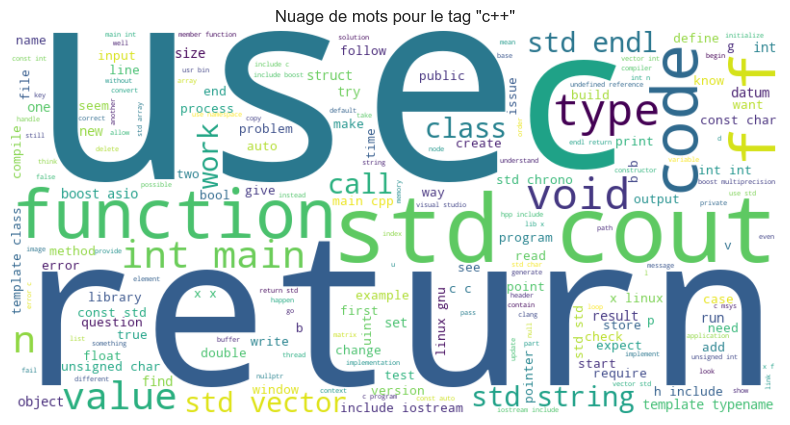

In [50]:
# BAG OF WORDS des 7 Tags les + importants

# Créer un df_tag_filtered avec les 8 premières colonnes de df5_combined
df_tag_filtered = df5_combined.iloc[:, :8]

# Convertir les valeurs des colonnes 2 à 8 en entiers (si nécessaire)
df_tag_filtered.iloc[:, 1:] = df_tag_filtered.iloc[:, 1:].apply(pd.to_numeric, errors='coerce')

# Calculer la somme des 0 et des 1 sur les colonnes 2 à 8
df_tag_filtered['sum'] = df_tag_filtered.iloc[:, 1:].sum(axis=1)

# Ne garder que les lignes où la somme est positive
df_tag_filtered = df_tag_filtered[df_tag_filtered['sum'] > 0]

# Supprimer la colonne 'sum'
df_tag_filtered = df_tag_filtered.drop(columns=['sum'])

# Afficher les premières lignes pour vérifier
df_tag_filtered


# Fonction pour créer un nuage de mots pour un tag spécifique
def create_wordcloud_for_tag(df_tag_filtered, tag):
    # Sélectionner les lignes où le tag a la valeur 1
    rows_with_tag = df_tag_filtered[df_tag_filtered[tag] == 1]
    
    # Fusionner toutes les colonnes 'Cleaned_Title_Body' pour ces lignes en une seule chaîne de texte
    text = ' '.join(rows_with_tag['Cleaned_Title_Body'].astype(str))
    
    # Créer le nuage de mots
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    # Afficher le nuage de mots
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Nuage de mots pour le tag "{tag}"')
    plt.show()

# Liste des tags à analyser (colonnes 2 à 8)
tags_columns = df_tag_filtered.columns[1:]  # Prendre toutes les colonnes sauf la première ('Cleaned_Title_Body')

# Créer un nuage de mots pour chaque tag
for tag in tags_columns:
    create_wordcloud_for_tag(df_tag_filtered, tag)





## 3.2 Transformation avec Tf-Idf

Le TfidfVectorizer diffère du CountVectorizer en ce qu'il prend en compte non seulement la fréquence des mots dans chaque document, mais aussi leur rareté dans l'ensemble du corpus. Cela permet de donner plus de poids aux termes rares et pertinents, tandis que le CountVectorizer se contente de compter les occurrences des mots sans tenir compte de leur fréquence dans le corpus. Le TfidfVectorizer est donc plus adapté pour des tâches où la distinction entre mots fréquents et rares est importante.

In [51]:
pd.set_option('display.max_columns', None)


In [52]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Initialiser le TfidfVectorizer avec des critères de sélection des mots
tfidf_vectorizer = TfidfVectorizer(
    min_df=0.015,             # Exclure les mots qui apparaissent dans moins de 1.5% des documents
    max_df=0.95,              # Exclure les mots qui apparaissent dans plus de 95% des documents
)

# Appliquer TfidfVectorizer à la colonne 'Cleaned_Title_Body' de df5
tfidf_matrix = tfidf_vectorizer.fit_transform(df5['Cleaned_Title_Body'])

# Convertir en DataFrame pour un aperçu
tfidf_matrix_float32 = tfidf_matrix.astype('float32')
df6 = pd.DataFrame(tfidf_matrix_float32.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Afficher un aperçu des résultats
df6


able  accept  access    accord  account  achieve  across  action  \
0       0.0     0.0     0.0  0.000000      0.0      0.0     0.0     0.0   
1       0.0     0.0     0.0  0.000000      0.0      0.0     0.0     0.0   
2       0.0     0.0     0.0  0.000000      0.0      0.0     0.0     0.0   
3       0.0     0.0     0.0  0.000000      0.0      0.0     0.0     0.0   
4       0.0     0.0     0.0  0.000000      0.0      0.0     0.0     0.0   
...     ...     ...     ...       ...      ...      ...     ...     ...   
49995   0.0     0.0     0.0  0.000000      0.0      0.0     0.0     0.0   
49996   0.0     0.0     0.0  0.000000      0.0      0.0     0.0     0.0   
49997   0.0     0.0     0.0  0.000000      0.0      0.0     0.0     0.0   
49998   0.0     0.0     0.0  0.000000      0.0      0.0     0.0     0.0   
49999   0.0     0.0     0.0  0.105867      0.0      0.0     0.0     0.0   

       active  actual  actually      add  additional  address  admin  advance  \
0         0.0     0.0  0.000000  0.04327         0.0      0.0    0.0      0.0   
1         0.0     0.0  0.108045  0.00000         0.0      0.0    0.0      0.0   
2         0.0     0.0  0.000000  0.00000         0.0      0.0    0.0      0.0   
3         0.0     0.0  0.000000  0.00000         0.0      0.0    0.0      0.0   
4         0.0     0.0  0.000000  0.00000         0.0      0.0    0.0      0.0   
...       ...     ...       ...      ...         ...      ...    ...      ...   
49995     0.0     0.0  0.000000  0.00000         0.0      0.0    0.0      0.0   
49996     0.0     0.0  0.000000  0.00000         0.0      0.0    0.0      0.0   
49997     0.0     0.0  0.000000  0.00000         0.0      0.0    0.0      0.0   
49998     0.0     0.0  0.000000  0.00000         0.0      0.0    0.0      0.0   
49999     0.0     0.0  0.000000  0.00000         0.0      0.0    0.0      0.0   

       algorithm  align  allow  along  already      also  alternative  \
0            0.0    0.0    0.0    0.0      0.0  0.000000          0.0   
1            0.0    0.0    0.0    0.0      0.0  0.000000          0.0   
2            0.0    0.0    0.0    0.0      0.0  0.000000          0.0   
3            0.0    0.0    0.0    0.0      0.0  0.043239          0.0   
4            0.0    0.0    0.0    0.0      0.0  0.000000          0.0   
...          ...    ...    ...    ...      ...       ...          ...   
49995        0.0    0.0    0.0    0.0      0.0  0.000000          0.0   
49996        0.0    0.0    0.0    0.0      0.0  0.017439          0.0   
49997        0.0    0.0    0.0    0.0      0.0  0.000000          0.0   
49998        0.0    0.0    0.0    0.0      0.0  0.045693          0.0   
49999        0.0    0.0    0.0    0.0      0.0  0.000000          0.0   

       although  always  amount  android  angular  annotation  another  \
0           0.0     0.0     0.0      0.0      0.0         0.0      0.0   
1           0.0     0.0     0.0      0.0      0.0         0.0      0.0   
2           0.0     0.0     0.0      0.0      0.0         0.0      0.0   
3           0.0     0.0     0.0      0.0      0.0         0.0      0.0   
4           0.0     0.0     0.0      0.0      0.0         0.0      0.0   
...         ...     ...     ...      ...      ...         ...      ...   
49995       0.0     0.0     0.0      0.0      0.0         0.0      0.0   
49996       0.0     0.0     0.0      0.0      0.0         0.0      0.0   
49997       0.0     0.0     0.0      0.0      0.0         0.0      0.0   
49998       0.0     0.0     0.0      0.0      0.0         0.0      0.0   
49999       0.0     0.0     0.0      0.0      0.0         0.0      0.0   

       answer    anyone  anything  apache       api       app    appear  \
0         0.0  0.000000       0.0     0.0  0.000000  0.000000  0.000000   
1         0.0  0.000000       0.0     0.0  0.000000  0.000000  0.000000   
2         0.0  0.000000       0.0     0.0  0.000000  0.032531  0.103744   
3         0.0  0.000000       0.0     0.0  0.000000  0.000000  0.00

## 3.3 Analyse Descriptive des mots TF-IDF

**Distribution des valeurs TF-IDF**

In [53]:
# Récupérer les mots (features) et leurs scores TF-IDF maximaux
words = tfidf_vectorizer.get_feature_names_out()
max_tfidf_scores = df6.max(axis=0)

# Trier les mots par score TF-IDF décroissant
top_words = max_tfidf_scores.sort_values(ascending=False).head(20)

# Trier les mots par score TF-IDF décroissant
flop_words = max_tfidf_scores.sort_values(ascending=True).head(20)
# Afficher les 20 mots ayant les scores TF-IDF les plus élevés et les 20 ayant les scores les plus bas
print("top-words")
print(top_words)
print("flop-words")
print(flop_words)


top-words
px         0.997899
module     0.996498
item       0.995084
com        0.994362
py         0.993496
div        0.992615
yes        0.991148
float      0.989188
db         0.988839
src        0.988262
status     0.988033
lib        0.987108
echo       0.985353
total      0.984557
ubuntu     0.984167
build      0.983784
printf     0.983763
product    0.982862
may        0.981399
self       0.981097
dtype: float32
flop-words
appreciate       0.254258
however          0.285310
although         0.299439
currently        0.314617
greatly          0.321423
necessary        0.323610
wrong            0.330936
whenever         0.333521
probably         0.334086
actually         0.335427
quite            0.340249
thought          0.340622
though           0.342143
unfortunately    0.348860
relevant         0.354699
successfully     0.354847
also             0.355834
believe          0.358089
encounter        0.367633
thank            0.368781
dtype: float32


use         1902.852173
error       1509.626709
file        1493.215942
import      1371.367065
value       1314.681763
get         1275.145874
app         1261.473389
datum       1249.924683
try         1212.268066
class       1204.427002
const       1182.307251
name        1177.035400
function    1158.512939
code        1156.243530
return      1155.273560
string      1120.999512
user        1061.130249
work        1035.806763
type        1022.566101
new          989.118347
dtype: float32


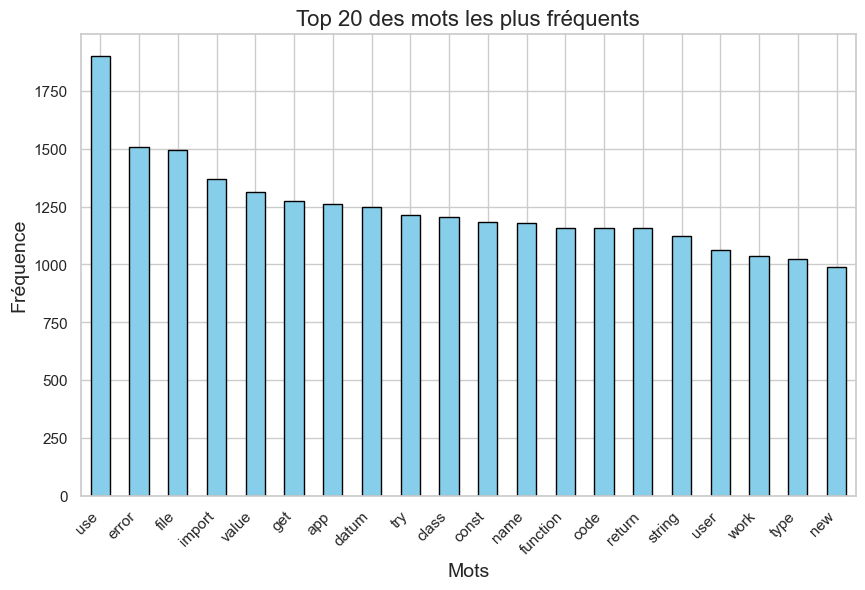

In [54]:

# Calculer la fréquence brute de chaque mot
word_frequencies = df6.sum(axis=0)

# Trier les mots par fréquence décroissante
top_words_by_freq = word_frequencies.sort_values(ascending=False).head(20)

# Afficher les 20 mots les plus fréquents
print(top_words_by_freq)

# Tracer un histogramme des mots les plus fréquents
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
top_words_by_freq.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Top 20 des mots les plus fréquents", fontsize=16)
plt.xlabel("Mots", fontsize=14)
plt.ylabel("Fréquence", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.show()


**Nuage des mots les plus fréquents**

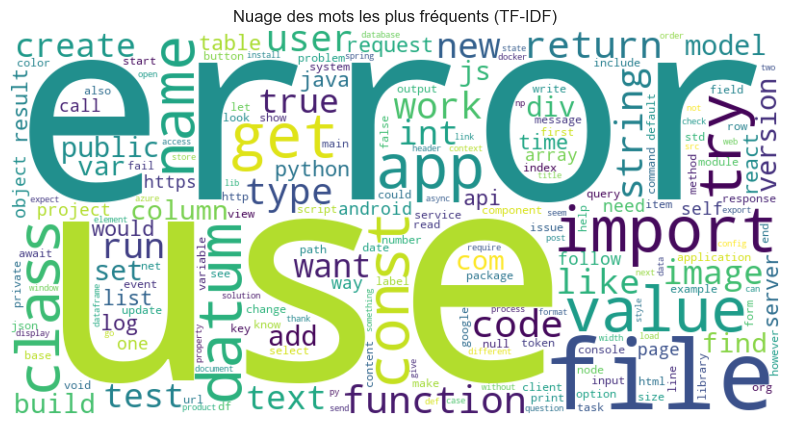

In [55]:

# Calculer la moyenne des scores TF-IDF pour chaque mot (en fonction des documents)
word_frequencies = df6.mean(axis=0)

# Trier les mots par score TF-IDF décroissant (les plus fréquents)
sorted_word_freq = word_frequencies.sort_values(ascending=False)

# Extraire les 200 mots les plus fréquents
most_frequent_words = sorted_word_freq.head(200)

# Créer le nuage de mots avec une palette de couleurs vives
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(most_frequent_words)

# Afficher le nuage de mots
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Nuage des mots les plus fréquents (TF-IDF)")
plt.show()


**Nuage des mots les moins fréquents**

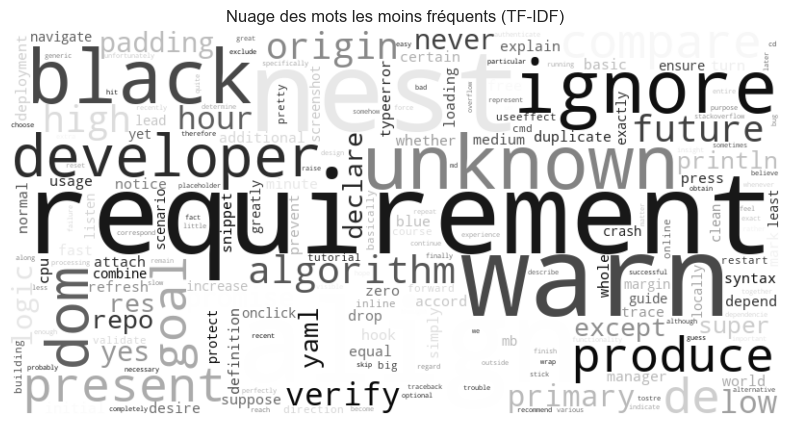

In [56]:

# Calculer la myenne des scores TF-IDF pour chaque mot (en fonction des documents)
word_frequencies = df6.mean(axis=0)

# Trier les mots par score TF-IDF croissant (les moins fréquents en haut)
sorted_word_freq = word_frequencies.sort_values(ascending=True)

# Extraire les 200 mots les moins fréquents
least_frequent_words = sorted_word_freq.head(200)

# Créer le nuage de mots avec une palette de gris
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='gray').generate_from_frequencies(least_frequent_words)

# Afficher le nuage de mots
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Nuage des mots les moins fréquents (TF-IDF)")
plt.show()


## 3.4 Réduction de dimensions

On utilise le taux de zéros pour déterminer quel algorithme de réduction de dimension utiliser, car une matrice creuse (avec un taux élevé de zéros) est plus efficace à traiter avec des algorithmes comme SVD (TruncatedSVD), qui sont conçus pour gérer les matrices creuses sans surcharger la mémoire. En revanche, les matrices denses (avec peu de zéros) sont mieux traitées par PCA, qui nécessite une matrice complète. Le taux de zéros aide donc à choisir l'approche la plus performante pour la réduction de dimension.

In [57]:

# Calculer la proportion de zéros dans la matrice
zero_count = np.count_nonzero(df6.values == 0)
total_elements = df6.size
zero_ratio = zero_count / total_elements

# Afficher le pourcentage de zéros
print(f"Le pourcentage de zéros dans la matrice est : {zero_ratio * 100:.2f}%")

# Vérifier si plus de 70% des éléments sont des zéros
if zero_ratio > 0.7:
    print("La matrice est creuse (plus de 70% de zéros), la méthode SVD (TruncatedSVD) devrait en théorie donner de meilleurs résultats.")
else:
    print("La matrice est dense (moins de 70% de zéros), PCA devrait en théorie donner de meilleurs résultats.")


Le pourcentage de zéros dans la matrice est : 94.44%
La matrice est creuse (plus de 70% de zéros), la méthode SVD (TruncatedSVD) devrait en théorie donner de meilleurs résultats.


Méthode du coude pour SVD, sans standardisation

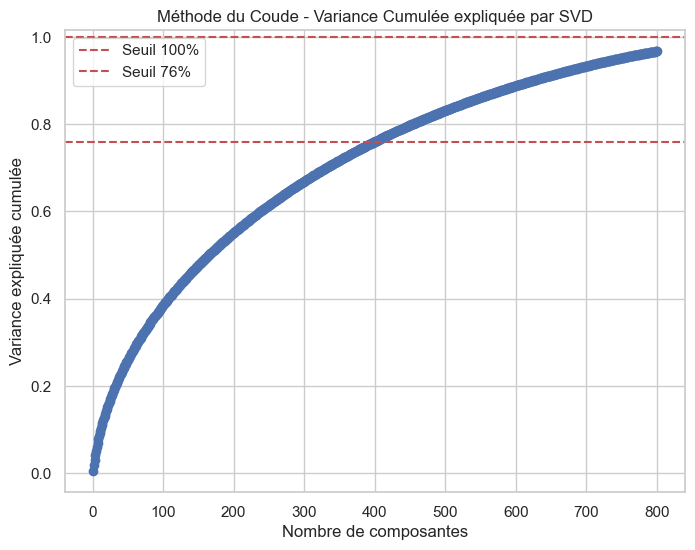

Variance expliquée cumulée maximale atteinte : 0.9677


In [58]:
# Appliquer TruncatedSVD sur la matrice brute df6 (sans normalisation)
svd = TruncatedSVD(n_components=800, random_state=42)
svd.fit(df6)

# Récupérer la variance expliquée par chaque composante
explained_variance_ratio = svd.explained_variance_ratio_

# Calculer la variance cumulée
cumulative_variance = explained_variance_ratio.cumsum()

# Tracer la courbe de la variance expliquée
plt.figure(figsize=(8, 6))
plt.plot(range(1, 801), cumulative_variance, marker='o', color='b')
plt.title("Méthode du Coude - Variance Cumulée expliquée par SVD")
plt.xlabel("Nombre de composantes")
plt.ylabel("Variance expliquée cumulée")
plt.grid(True)
plt.axhline(y=1.0, color='r', linestyle='--', label="Seuil 100%")  # Ligne de référence à 100%
plt.axhline(y=0.76, color='r', linestyle='--', label="Seuil 76%")  # Ligne de référence à 76%

plt.legend()
plt.show()

# Afficher la variance maximale atteinte
max_variance = cumulative_variance[-1]
print(f"Variance expliquée cumulée maximale atteinte : {max_variance:.4f}")

Méthode du coude pour SVD, avec standardisation MinMax

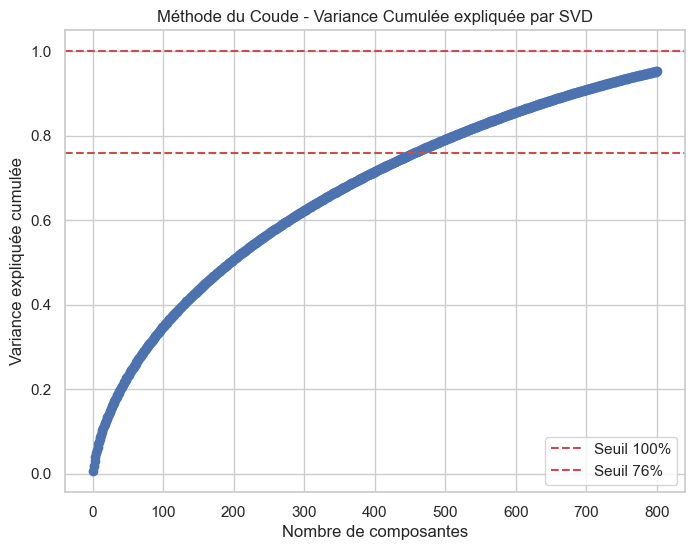

Variance expliquée cumulée maximale atteinte : 0.9525


In [59]:

# Normalisation des données avec MinMaxScaler
scaler = MinMaxScaler()
df6_normalized = scaler.fit_transform(df6)

# SVD sur la matrice brute df6 (avec normalisation)
svd = TruncatedSVD(n_components=800, random_state=42)
svd.fit(df6_normalized)

# Récupérer la variance expliquée par chaque composante
explained_variance_ratio = svd.explained_variance_ratio_

# Calculer la variance cumulée
cumulative_variance = explained_variance_ratio.cumsum()

# Tracer la courbe de la variance expliquée
plt.figure(figsize=(8, 6))
plt.plot(range(1, 801), cumulative_variance, marker='o', color='b')
plt.title("Méthode du Coude - Variance Cumulée expliquée par SVD")
plt.xlabel("Nombre de composantes")
plt.ylabel("Variance expliquée cumulée")
plt.grid(True)
plt.axhline(y=1.0, color='r', linestyle='--', label="Seuil 100%")  # Ligne de référence à 100%
plt.axhline(y=0.76, color='r', linestyle='--', label="Seuil 76%")  # Ligne de référence à 76%

plt.legend()
plt.show()

# Afficher la variance maximale atteinte
max_variance = cumulative_variance[-1]
print(f"Variance expliquée cumulée maximale atteinte : {max_variance:.4f}")

Pas de coude significatif et la variance expliquée cumulée baisse par rapport à la version sans standardisation.<br>
Par conséquent, nous n'utiliserons pas la standardisation.<br>
Deuxièmement, à défaut de coude significatif, nous prendrons à peu près 76% de l'information avec 400 composantes.

**Truncated SVD sur la matrice TF-IDF**

In [60]:
# Importation des bibliothèques nécessaires
from sklearn.decomposition import TruncatedSVD
import pandas as pd

# Appliquer Truncated SVD sur la matrice brute df6 (sans normalisation) avec 400 composantes
svd = TruncatedSVD(n_components=400, random_state=42)
df6_svd = svd.fit_transform(df6)

# Convertir la matrice résultante en DataFrame
df7 = pd.DataFrame(df6_svd)

# Afficher un aperçu du DataFrame df7
df7


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399
0,0.194914,0.165796,-0.083138,0.144033,0.002114,-0.044627,0.017374,0.044141,-0.013687,-0.115646,0.096719,-0.029391,0.029461,-0.029239,0.037769,-0.001239,0.049557,-0.191073,-0.051007,0.368154,0.008656,0.520349,-0.097489,0.226054,-0.016758,-0.032911,-0.116535,0.133791,0.050685,-0.038255,-0.124501,0.018811,-0.007513,-0.055656,-0.016673,0.027073,-0.033398,0.022939,-0.015246,-0.064405,-0.007637,0.007537,-0.022787,0.096395,-0.069133,0.044128,0.019755,-0.023001,0.019734,-0.002167,0.005481,0.046145,0.039395,-0.072358,-0.018780,0.019914,-0.025370,0.002919,-0.016300,-0.002821,-0.016546,0.003743,0.047690,-0.024036,0.002919,-0.053248,-0.025657,0.032426,0.071589,0.047866,-0.001889,-0.008178,-0.017088,-0.065847,0.005386,0.008693,-0.025456,0.056164,-0.056879,-0.029295,0.011437,-0.011980,-0.015145,-0.014784,-0.003002,0.051026,0.042015,0.000552,0.004807,0.002093,0.035548,-0.017110,-0.014455,-0.065402,-0.044052,-0.002197,-0.001045,-0.008729,-0.001677,0.001934,0.031085,0.003727,0.027695,-0.054388,0.019839,-0.014715,-0.025488,-0.031948,-0.029258,-0.008123,-0.013367,0.034183,0.000016,-0.030911,0.005742,0.087577,-0.045086,0.005660,0.004028,-0.050463,0.011954,0.013866,-0.014347,-0.042502,0.003316,-0.004711,-0.012425,-0.092191,0.040155,-0.059996,0.005134,-0.067249,0.040315,0.000189,-0.044152,0.018436,0.008114,0.024914,-0.013694,0.040202,0.030220,-0.092092,-0.010587,-0.015005,0.021651,0.001481,0.016025,-0.040139,-0.004804,0.034399,-0.012747,-0.003093,-0.054769,-0.012341,-0.084888,-0.008411,0.014547,-0.044589,0.005684,-0.077770,0.031067,0.032599,-0.012922,0.019142,-0.009844,0.009978,0.047216,-0.029821,0.005131,0.009136,0.063782,0.029668,0.047014,0.013160,-0.032469,-0.045554,-0.043358,-0.015246,0.019426,0.017276,-0.045735,-0.027031,-0.048799,0.046722,-0.041626,-0.013034,-0.027671,-0.003256,-0.009727,0.050834,0.051970,-0.019127,-0.021909,0.004763,0.045240,-0.015207,-0.030146,0.008050,0.044669,0.029106,0.009467,-0.036989,-0.039733,-0.046344,0.028515,0.006768,0.108374,0.034221,0.004459,-0.022522,-0.016602,-0.010854,-0.030513,0.032407,-0.034526,-0.058774,0.030028,0.017107,0.018217,-0.012601,-0.002943,0.041632,-0.001615,0.001483,0.053149,-0.051185,-0.007585,0.046783,-0.018597,0.014035,0.023440,-0.013332,-0.020372,-0.030172,0.019439,-0.018000,0.003231,0.017969,0.019607,0.027665,0.007521,0.019675,0.049983,0.014402,-0.001597,0.003179,-0.009849,0.011255,-0.003883,-0.018303,-0.018722,0.011251,-0.024599,-0.006623,0.040997,-0.011226,-0.005146,0.005651,-0.005872,-0.036946,-0.027602,-0.009199,-0.012643,-0

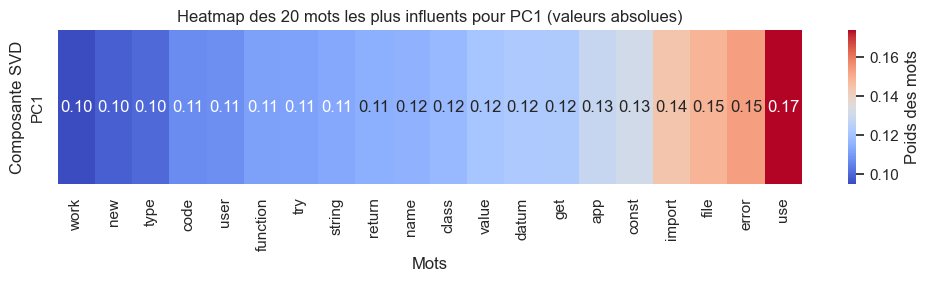

In [61]:
# Récupérer la première composante
comp1 = svd.components_[0]

# Récupérer les mots associés (colonnes de df6)
mots = df6.columns  

# Sélectionner les n mots les plus influents en termes de valeur absolue
n_mots = 20
indices_pc1 = np.argsort(np.abs(comp1))[-n_mots:]  # Les plus grands en valeur absolue

# Créer une matrice de poids pour les mots influents dans PC1 (valeurs réelles)
heatmap_data = np.zeros((1, n_mots))
heatmap_data[0, :] = comp1[indices_pc1]  # Poids réels (positifs ou négatifs)

# Créer un DataFrame pour les mots et leurs poids
heatmap_df = pd.DataFrame(heatmap_data, columns=mots[indices_pc1], index=["PC1"])

# Affichage de la heatmap
plt.figure(figsize=(12, 2))  # Ajuster la taille en fonction des besoins
sns.heatmap(heatmap_df, cmap='coolwarm', annot=True, fmt='.2f', cbar_kws={'label': 'Poids des mots'})
plt.title("Heatmap des 20 mots les plus influents pour PC1 (valeurs absolues)")
plt.xlabel("Mots")
plt.ylabel("Composante SVD")
plt.xticks(rotation=90)  # Rotation des labels des mots pour les rendre lisibles
plt.show()


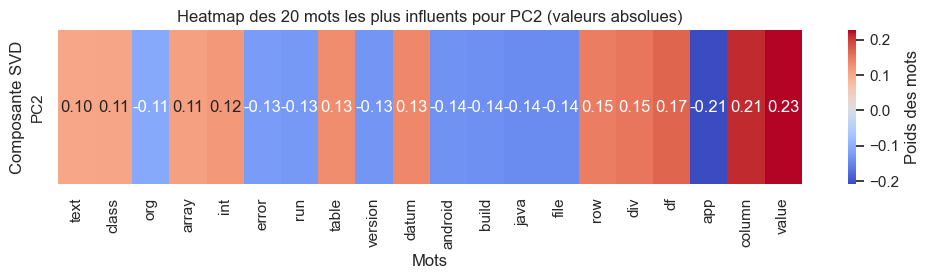

In [62]:
# Récupérer la deuxième composante
comp2 = svd.components_[1]

# Récupérer les mots associés (colonnes de df6)
mots = df6.columns  

# Sélectionner les n mots les plus influents en termes de valeur absolue
n_mots = 20
indices_pc2 = np.argsort(np.abs(comp2))[-n_mots:]  # Les plus grands en valeur absolue

# Créer une matrice de poids pour les mots influents dans PC2 (valeurs réelles)
heatmap_data = np.zeros((1, n_mots))
heatmap_data[0, :] = comp2[indices_pc2]  # Poids réels (positifs ou négatifs)

# Créer un DataFrame pour les mots et leurs poids
heatmap_df = pd.DataFrame(heatmap_data, columns=mots[indices_pc2], index=["PC2"])

# Affichage de la heatmap
plt.figure(figsize=(12, 2))  # Ajuster la taille en fonction des besoins
sns.heatmap(heatmap_df, cmap='coolwarm', annot=True, fmt='.2f', cbar_kws={'label': 'Poids des mots'})
plt.title("Heatmap des 20 mots les plus influents pour PC2 (valeurs absolues)")
plt.xlabel("Mots")
plt.ylabel("Composante SVD")
plt.xticks(rotation=90)  # Rotation des labels des mots pour les rendre lisibles
plt.show()


**Exportation des dataframes sous pickle**

In [63]:
df5.to_pickle(r"C:\Users\ggenv\OneDrive\Documents\MLE\P5\df5.pkl") #  Cleaned_Title_Body (50000 * 2)
df6.to_pickle(r"C:\Users\ggenv\OneDrive\Documents\MLE\P5\df6.pkl") #  TF-IDF de Cleaned_Title_Body (50000 * 944)
df7.to_pickle(r"C:\Users\ggenv\OneDrive\Documents\MLE\P5\df7.pkl") # svd de TF-IDF (50000 * 400) 
df2_filtered_100.to_pickle(r"C:\Users\ggenv\OneDrive\Documents\MLE\P5\df2_filtered_100.pkl") # les 100 Tags les plus fréquents